## Exploring Weather and Avalanche Forecast APIs

##### APIs being tested
##### Avalanche.org Forecast API
##### AWDB API
##### Open-Meteo (ERA5 archive)

In [1]:
# Constants
PGH_LAT, PGH_LON = 39.36790, - 120.36749  # Peter Grubb Hut seed point
TEST_LAT, TEST_LON = 39.35862, -120.36492  # Castle Pass seed point
FT_TO_M = 0.3048
TEST_ELEV_FT = 7929
TEST_ELEV_M = TEST_ELEV_FT * FT_TO_M

In [2]:
# Util Packages & Functions
import sys
import pprint
import math

def haversine_distance(lat1, lon1, lat2, lon2):
    # Convert decimal degrees to radians 
    lat1, lon1, lat2, lon2 = map(math.radians, [lat1, lon1, lat2, lon2])

    # Haversine formula 
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = math.sin(dlat/2)**2 + math.cos(lat1) * math.cos(lat2) * math.sin(dlon/2)**2
    c = 2 * math.atan2(math.sqrt(a), math.sqrt(1-a)) 
    distance_km = 6371 * c
    return distance_km

def lat_lon_distance(lat1, lon1, lat2, lon2):
    # L2 distance
    return ((lat1 - lat2) ** 2 + (lon1 - lon2) ** 2) ** 0.5

def dist_elevation_score(lat1, lon1, zone_median_elev_m, lat2, lon2, station_elev_m):
    distance_km = haversine_distance(lat1, lon1, lat2, lon2)
    score = distance_km + 0.002 * abs(station_elev_m - zone_median_elev_m)
    return score

In [3]:
import requests

AVY_MAP_LAYER = "https://api.avalanche.org/v2/public/products/map-layer"

r = requests.get(AVY_MAP_LAYER, timeout=30)
r.raise_for_status()
geo = r.json()

In [4]:
# Initial Overall Region Danger Rating GET

from shapely.geometry import shape, Point

pt = Point(TEST_LON, TEST_LAT)

zone_feature = None
for feat in geo["features"]:
    geom = shape(feat["geometry"])
    if geom.contains(pt):
        zone_feature = feat
        break

assert zone_feature is not None, "No avalanche forecast polygon contained the seed point."

zone_meta = {
    "zone_feature_id": zone_feature["id"],
    "zone_name": zone_feature["properties"]["name"],
    "center": zone_feature["properties"]["center"],
    "danger_level": zone_feature["properties"]["danger_level"],
    "danger_text": zone_feature["properties"]["danger"],
    "start_date": zone_feature["properties"]["start_date"],
    "end_date": zone_feature["properties"]["end_date"],
    "forecast_link": zone_feature["properties"]["link"],
}
pprint.pprint(zone_meta)


{'center': 'Sierra Avalanche Center',
 'danger_level': -1,
 'danger_text': 'no rating',
 'end_date': None,
 'forecast_link': 'https://www.sierraavalanchecenter.org/forecasts/avalanche/central-sierra-nevada#/central-sierra-nevada/',
 'start_date': None,
 'zone_feature_id': 2458,
 'zone_name': 'Central Sierra Nevada'}


In [5]:
# Historical Danger Forecast and Ratings (Labels)

import json
import re
import time
from pathlib import Path
from urllib.parse import urljoin

import pandas as pd
import requests
from bs4 import BeautifulSoup

BASE_URL = "https://archive.sierraavalanchecenter.org"
ARCHIVE_URL = BASE_URL + "/prior-jan-6-2021/archive"
ADVISORY_URL = BASE_URL + "/advisory/2020/apr/6/2020-04-06-065948-avalanche-forecast"

FORECAST_SITE_BASE_URL = "https://www.sierraavalanchecenter.org"
PRODUCTS_API_URL = "https://api.avalanche.org/v2/public/products"

# Region config (change these to support a different forecast region)
AVALANCHE_CENTER_ID = "SAC"
FORECAST_AREA_NAME = "Central Sierra Nevada"
FORECAST_AREA_SLUG = "central-sierra-nevada"
FORECAST_AREA_NUMERIC_ID = 2458
DEFAULT_ZONE_ROUTE_ID = "1"

# Temporal/config knobs
SEASON_START_MONTH = 9
SEASON_END_MONTH = 8
REQUEST_TIMEOUT_SECONDS = 60
REQUEST_SLEEP_SECONDS = 0.25

FORECAST_ARCHIVE_URL = FORECAST_SITE_BASE_URL + f"/forecasts/avalanche/{FORECAST_AREA_SLUG}#/archive/forecast"

# Saved HTML for archive listing pages (for offline parsing / debugging)
ARCHIVE_HTML_CACHE = Path("offline_data/html_cache/archive")

HEADERS = {
    "User-Agent": "nw-tahoe-avy-research/0.1 (personal project; contact: casperchadwick@gmail.com)",
    "Accept-Language": "en-US,en;q=0.9",
}

# Filled during advisory-link collection; lets downstream code skip known complete dates.
PRODUCT_ID_TO_PUBLISHED_DATE = {}


def fetch_html(url: str) -> str:
    # Cache archive listing pages only; include query + fragment to keep page variants distinct
    path_part, _, query_part = url.partition("?")
    query_only, _, fragment_part = query_part.partition("#")
    out_path = None

    is_archive_listing = (
        "/archive" in path_part
        or "#/archive" in url
        or "/forecasts/avalanche/" in path_part
    )

    if is_archive_listing:
        ARCHIVE_HTML_CACHE.mkdir(parents=True, exist_ok=True)
        normalized = (
            path_part.replace(BASE_URL, "archive/")
            .replace(FORECAST_SITE_BASE_URL, "forecast_site/")
            .strip("/")
        )
        if query_only:
            normalized = f"{normalized}__q_{query_only}"
        if fragment_part:
            normalized = f"{normalized}__f_{fragment_part}"
        slug = re.sub(r"[^\w.-]+", "_", normalized)[:180] or "archive"
        out_path = ARCHIVE_HTML_CACHE / f"{slug}.html"

        if out_path.exists():
            return out_path.read_text(encoding="utf-8")

    # Only send request if the cached file doesn't exist
    r = requests.get(url, headers=HEADERS, timeout=REQUEST_TIMEOUT_SECONDS)
    r.raise_for_status()
    html = r.text

    if out_path is not None and not out_path.exists():
        out_path.write_text(html, encoding="utf-8")

    return html


def clean_text(text: str) -> str:
    return re.sub(r"\s+", " ", text).strip()


def advisory_href_to_fetch_url(href: str, source_page_url: str) -> str:
    """Normalize advisory links from archive URLs."""
    full_url = urljoin(source_page_url, href)
    if "#/forecast/" in full_url:
        full_url = full_url.replace("#/forecast/", "/forecast/")
    return full_url


def hydrate_product_id_dates_from_cache(cache_dir: Path):
    """
    Populate PRODUCT_ID_TO_PUBLISHED_DATE from already cached forecast pages.

    Expected cached filename pattern includes ..._forecast_<zone>_<product_id>.html
    based on the fetch_html cache slug normalization.
    """
    hydrated = 0
    for fp in cache_dir.glob("*.html"):
        m = re.search(r"_forecast_(\d+)_(\d+)\.html$", fp.name)
        if not m:
            continue

        product_id = int(m.group(2))
        if product_id in PRODUCT_ID_TO_PUBLISHED_DATE and PRODUCT_ID_TO_PUBLISHED_DATE[product_id]:
            continue

        try:
            html = fp.read_text(encoding="utf-8")
            parsed = parse_advisory_page(html)
            fd = parsed.get("forecast_date")
            if not fd:
                continue
            dt = pd.to_datetime(fd, format="%B %d, %Y", errors="coerce")
            if pd.isna(dt):
                continue
            # Match products API style (ISO-like string) enough for downstream pd.to_datetime.
            PRODUCT_ID_TO_PUBLISHED_DATE[product_id] = dt.strftime("%Y-%m-%dT00:00:00")
            hydrated += 1
        except Exception:
            continue

    if hydrated:
        print(f"Hydrated {hydrated} product-id dates from html cache")


def load_products_response(cache_dir: Path):
    """Fetch products list for the configured avalanche center."""
    r = requests.get(
        PRODUCTS_API_URL,
        headers=HEADERS,
        params={"avalanche_center_id": AVALANCHE_CENTER_ID},
        timeout=REQUEST_TIMEOUT_SECONDS,
    )
    r.raise_for_status()
    return r.json()


def cache_product_page(cache_dir: Path, zone_id: str, product_id: int, published_dt: pd.Timestamp):
    """
    Persist each product endpoint response as its own date-tagged JSON file.

    Filename pattern: product_<YYYY-MM-DD>_<zone>_<product_id>.json
    """
    date_tag = published_dt.strftime("%Y-%m-%d")
    out_path = cache_dir / f"product_{date_tag}_{zone_id}_{product_id}.json"
    if out_path.exists():
        return

    product_url = f"https://api.avalanche.org/v2/public/product/{product_id}"
    try:
        r = requests.get(product_url, headers=HEADERS, timeout=REQUEST_TIMEOUT_SECONDS)
        r.raise_for_status()
        payload = r.json()
        out_path.write_text(json.dumps(payload, ensure_ascii=True, indent=2), encoding="utf-8")
    except Exception:
        # Non-fatal: keep main pipeline running even if product-page cache misses.
        pass


def load_cached_records_by_date(cache_dir: Path):
    """Parse cached advisory html files and index by forecast date."""
    records_by_date = {}
    loaded = 0
    for fp in cache_dir.glob("advisory_*.html"):
        try:
            html = fp.read_text(encoding="utf-8")
            parsed = parse_advisory_page(html)
            rec = parsed_advisory_to_record(parsed)
            if not rec:
                continue
            dt = pd.to_datetime(rec["date"], errors="coerce")
            if pd.isna(dt):
                continue
            dt = dt.normalize()
            records_by_date[dt] = {
                "date": dt,
                "ATL": rec.get("ATL"),
                "NTL": rec.get("NTL"),
                "BTL": rec.get("BTL"),
            }
            loaded += 1
        except Exception:
            continue

    if loaded:
        print(f"Loaded {loaded} cached advisory record(s) from html_cache")
    return records_by_date


def collect_advisory_rows_for_seasons(season_labels: list[str]):
    """
    Single collection method for ALL seasons via Avalanche.org products API.

    For each requested season, build advisory links from forecast products:
    /forecasts/avalanche/{FORECAST_AREA_SLUG}#/forecast/{zone_id}/{product_id}
    """

    def season_window(label: str):
        sy = 2000 + int(label.split("/")[0])
        start = pd.Timestamp(year=sy, month=SEASON_START_MONTH, day=1)
        end = pd.Timestamp(year=sy + 1, month=SEASON_END_MONTH, day=31)
        return start, end

    def season_label_from_date_local(dt: pd.Timestamp) -> str:
        y = dt.year if dt.month >= SEASON_START_MONTH else dt.year - 1
        return f"{y % 100:02d}/{(y + 1) % 100:02d}"

    windows = {s: season_window(s) for s in season_labels}

    try:
        products = load_products_response(ARCHIVE_HTML_CACHE)
    except Exception as e:
        print(f"Products API unavailable; cannot collect advisory links: {e}")
        return []

    rows = []
    seen = set()
    PRODUCT_ID_TO_PUBLISHED_DATE.clear()
    for p in products:
        if p.get("product_type") != "forecast":
            continue

        published = pd.to_datetime(p.get("published_time"), errors="coerce")
        if pd.isna(published):
            continue
        dt = published.tz_convert(None).normalize() if published.tzinfo else published.normalize()

        season = season_label_from_date_local(dt)
        if season not in windows:
            continue

        start, end = windows[season]
        if not (start <= dt <= end):
            continue

        zones = p.get("forecast_zone") or []
        zone_id = None
        for z in zones:
            if z.get("id") == FORECAST_AREA_NUMERIC_ID or str(z.get("name", "")).lower() == FORECAST_AREA_NAME.lower():
                zone_id = str(z.get("zone_id") or DEFAULT_ZONE_ROUTE_ID)
                break
        if zone_id is None:
            continue

        product_id = p.get("id")
        if product_id is None:
            continue
        PRODUCT_ID_TO_PUBLISHED_DATE[int(product_id)] = p.get("published_time")
        cache_product_page(ARCHIVE_HTML_CACHE, zone_id, int(product_id), dt)
        href = f"/forecasts/avalanche/{FORECAST_AREA_SLUG}#/forecast/{zone_id}/{product_id}"
        if href in seen:
            continue
        seen.add(href)

        # Capture ratings directly from API payload to avoid relying on
        # client-side forecast routes that may 404 in raw HTTP fetches.
        danger_list = p.get("danger") or []
        danger_current = None
        for d in danger_list:
            if d.get("valid_day") == "current":
                danger_current = d
                break
        if danger_current is None and danger_list:
            danger_current = danger_list[0]

        api_record = None
        if danger_current is not None:
            api_record = {
                "date": dt,
                "ATL": danger_current.get("upper"),
                "NTL": danger_current.get("middle"),
                "BTL": danger_current.get("lower"),
            }

        rows.append({
            "advisory_url": href,
            "source_page_url": FORECAST_ARCHIVE_URL,
            "source_branch": "products_api",
            "season_option": season,
            "row_text": "",
            "published_date": dt,
            "api_record": api_record,
        })

    print(f"Collected {len(rows)} advisory links across all requested seasons")
    return rows


def parse_advisory_page(html: str):
    soup = BeautifulSoup(html, "html.parser")
    full_text = clean_text(soup.get_text(" ", strip=True))

    date_match = re.search(
        r"Avalanche Forecast published on ([A-Za-z]+ \d{1,2}, \d{4})",
        full_text
    )
    forecast_date = date_match.group(1) if date_match else None

    upper = soup.select_one("#upper-rating")
    mid = soup.select_one("#mid-rating")
    lower = soup.select_one("#lower-rating")

    return {
        "forecast_date": forecast_date,
        "upper_rating_text": clean_text(upper.get_text(" ", strip=True)) if upper else None,
        "mid_rating_text": clean_text(mid.get_text(" ", strip=True)) if mid else None,
        "lower_rating_text": clean_text(lower.get_text(" ", strip=True)) if lower else None,
    }


# Danger ratings sample table (first archive page → parquet)
SAMPLE_DATA_PARQUET = Path("offline_data/sample_data.parquet")


def extract_danger_rating(rating_text: str | None) -> int | None:
    """Leading 1–5 level from strings like '3. Considerable ? Above Treeline'."""
    if not rating_text:
        return None
    m = re.match(r"^(\d+)\s*\.\s*", rating_text.strip())
    return int(m.group(1)) if m else None


def parsed_advisory_to_record(parsed: dict) -> dict | None:
    fd = parsed.get("forecast_date")
    if not fd:
        return None
    dt = pd.to_datetime(fd, format="%B %d, %Y", errors="coerce")
    if pd.isna(dt):
        return None
    return {
        "date": dt.normalize(),
        "ATL": extract_danger_rating(parsed.get("upper_rating_text")),
        "NTL": extract_danger_rating(parsed.get("mid_rating_text")),
        "BTL": extract_danger_rating(parsed.get("lower_rating_text")),
    }

In [6]:
def season_start_year(label: str) -> int:
    return 2000 + int(label.split("/")[0])


def season_label_from_date(dt: pd.Timestamp) -> str:
    y = dt.year if dt.month >= SEASON_START_MONTH else dt.year - 1
    return f"{y % 100:02d}/{(y + 1) % 100:02d}"


# Centralized season scope for scraping + retention.
# The scraper uses this list to determine date bounds and keeps/backfills any missing advisories in these seasons.
TARGET_SEASONS = [
    "14/15", "15/16", "16/17", "17/18", "18/19", "19/20",
    "20/21", "21/22", "22/23", "23/24", "24/25", "25/26",
]

print(f"Target seasons: {', '.join(TARGET_SEASONS)}")

earliest_start_year = min(season_start_year(s) for s in TARGET_SEASONS)
latest_start_year = max(season_start_year(s) for s in TARGET_SEASONS)
min_target_date = pd.Timestamp(year=earliest_start_year, month=SEASON_START_MONTH, day=1)
max_target_date = pd.Timestamp(year=latest_start_year + 1, month=SEASON_END_MONTH, day=31)

# Single advisory-link collection method for all seasons.
archive_rows = collect_advisory_rows_for_seasons(TARGET_SEASONS)
# Ensure product-id date mapping also benefits from already cached forecast pages.
hydrate_product_id_dates_from_cache(ARCHIVE_HTML_CACHE)
# Backward compatibility for older advisory_* cache files (date-keyed records).
cached_records_by_date = load_cached_records_by_date(ARCHIVE_HTML_CACHE)
print(f"Collected advisory links via products API: total={len(archive_rows)}")

# Preload existing rows so we can skip unnecessary fetches for complete dates
existing_df_for_skip = None
skip_complete_dates = set()
if SAMPLE_DATA_PARQUET.exists():
    existing_df_for_skip = pd.read_parquet(SAMPLE_DATA_PARQUET)
    existing_df_for_skip["date"] = pd.to_datetime(existing_df_for_skip["date"], errors="coerce").dt.normalize()
    existing_df_for_skip = existing_df_for_skip.dropna(subset=["date"])
    existing_df_for_skip = existing_df_for_skip[
        (existing_df_for_skip["date"] >= min_target_date) & (existing_df_for_skip["date"] <= max_target_date)
    ].copy()
    existing_df_for_skip["season"] = existing_df_for_skip["date"].map(season_label_from_date)
    existing_df_for_skip = existing_df_for_skip[existing_df_for_skip["season"].isin(TARGET_SEASONS)]

    required_cols = {"ATL", "NTL", "BTL"}
    if required_cols.issubset(existing_df_for_skip.columns):
        complete_mask = existing_df_for_skip[["ATL", "NTL", "BTL"]].notna().all(axis=1)
        skip_complete_dates = set(existing_df_for_skip.loc[complete_mask, "date"])

records = []
seen_fetch_urls = set()
skipped_known_complete = 0
reused_cached_records = 0
for row in archive_rows:
    fetch_url = advisory_href_to_fetch_url(row["advisory_url"], row.get("source_page_url", BASE_URL))
    if fetch_url in seen_fetch_urls:
        continue
    seen_fetch_urls.add(fetch_url)

    # Resolve forecast date from row/api mapping when possible.
    published_dt = pd.to_datetime(row.get("published_date"), errors="coerce")
    if pd.notna(published_dt):
        published_dt = published_dt.normalize()
    else:
        published_dt = None

    if published_dt is None:
        product_id_match = re.search(r"/forecast/\d+/(\d+)$", fetch_url)
        if product_id_match:
            pid = int(product_id_match.group(1))
            published_raw = PRODUCT_ID_TO_PUBLISHED_DATE.get(pid)
            if published_raw is not None:
                published_ts = pd.to_datetime(published_raw, errors="coerce")
                if pd.notna(published_ts):
                    published_dt = published_ts.tz_convert(None).normalize() if published_ts.tzinfo else published_ts.normalize()

    # Avoid fetch when date is already fully populated in parquet
    if published_dt is not None and published_dt in skip_complete_dates:
        skipped_known_complete += 1
        continue

    # If API record is already present, use it directly.
    api_record = row.get("api_record")
    if isinstance(api_record, dict) and api_record.get("date") is not None:
        records.append({
            "date": pd.to_datetime(api_record["date"], errors="coerce").normalize(),
            "ATL": api_record.get("ATL"),
            "NTL": api_record.get("NTL"),
            "BTL": api_record.get("BTL"),
        })
        continue

    # Backward-compatible cache reuse: if old advisory_* cache already has this date, reuse it.
    if published_dt is not None and published_dt in cached_records_by_date:
        records.append(cached_records_by_date[published_dt])
        reused_cached_records += 1
        continue

    try:
        html = fetch_html(fetch_url)
        parsed = parse_advisory_page(html)
    except Exception as e:
        print(f"Skip {fetch_url}: {e}")
        continue

    rec = parsed_advisory_to_record(parsed)
    if rec:
        records.append(rec)

    time.sleep(REQUEST_SLEEP_SECONDS)  # light pacing for the origin server

if skipped_known_complete:
    print(f"Skipped {skipped_known_complete} fetches for already-complete dates")
if reused_cached_records:
    print(f"Reused {reused_cached_records} records from cached advisory html files")

new_df = pd.DataFrame(records) if records else pd.DataFrame(columns=["date", "ATL", "NTL", "BTL"])
if not new_df.empty:
    new_df["date"] = pd.to_datetime(new_df["date"], errors="coerce").dt.normalize()
    new_df = new_df.dropna(subset=["date"])
    new_df = new_df[(new_df["date"] >= min_target_date) & (new_df["date"] <= max_target_date)].copy()
    new_df["season"] = new_df["date"].map(season_label_from_date)
    new_df = new_df[new_df["season"].isin(TARGET_SEASONS)]
    new_df = new_df.sort_values("date", ascending=False).drop_duplicates(subset=["date"], keep="first")

# Merge existing + newly scraped data for target seasons.
# For overlapping dates, prefer newly scraped non-null ratings to backfill leftovers.
if SAMPLE_DATA_PARQUET.exists():
    existing_df = pd.read_parquet(SAMPLE_DATA_PARQUET)
    existing_df["date"] = pd.to_datetime(existing_df["date"], errors="coerce").dt.normalize()
    existing_df = existing_df.dropna(subset=["date"])
    existing_df = existing_df[(existing_df["date"] >= min_target_date) & (existing_df["date"] <= max_target_date)].copy()
    existing_df["season"] = existing_df["date"].map(season_label_from_date)
    existing_df = existing_df[existing_df["season"].isin(TARGET_SEASONS)]

    existing_core = existing_df[["date", "ATL", "NTL", "BTL"]].copy()
    new_core = new_df[["date", "ATL", "NTL", "BTL"]].copy() if not new_df.empty else pd.DataFrame(columns=["date", "ATL", "NTL", "BTL"])

    existing_idx = existing_core.set_index("date")
    new_idx = new_core.set_index("date")
    merged_index = existing_idx.index.union(new_idx.index)
    merged = pd.DataFrame(index=merged_index)
    for col in ("ATL", "NTL", "BTL"):
        merged[col] = new_idx[col].combine_first(existing_idx[col])

    combined = merged.reset_index().rename(columns={"index": "date"})

    added_dates = len(set(new_idx.index) - set(existing_idx.index))
    overlap_dates = sorted(set(new_idx.index).intersection(set(existing_idx.index)))
    backfilled_rows = 0
    for dt in overlap_dates:
        old_row = existing_idx.loc[dt]
        new_row = new_idx.loc[dt]
        for col in ("ATL", "NTL", "BTL"):
            if pd.isna(old_row.get(col)) and not pd.isna(new_row.get(col)):
                backfilled_rows += 1
                break

    print(
        f"Existing target-season rows: {len(existing_core)}; added new dates: {added_dates}; "
        f"backfilled existing dates: {backfilled_rows}; total: {len(combined)}"
    )
else:
    combined = new_df[["date", "ATL", "NTL", "BTL"]].copy() if not new_df.empty else pd.DataFrame(columns=["date", "ATL", "NTL", "BTL"])
    print(f"No existing parquet found; writing {len(combined)} target-season rows")

# Ensure nullable integer dtype (robust to unexpected object/string values)
for col in ("ATL", "NTL", "BTL"):
    if col in combined.columns:
        combined[col] = pd.to_numeric(combined[col], errors="coerce").astype("Int64")

# Maximum danger rating across elevation bands for each forecast date
combined["Max"] = combined[["ATL", "NTL", "BTL"]].max(axis=1).astype("Int64")

combined["season"] = combined["date"].map(season_label_from_date)
combined = combined[combined["season"].isin(TARGET_SEASONS)]
combined = combined.sort_values("date", ascending=False).drop_duplicates(subset=["date"], keep="first").reset_index(drop=True)

SAMPLE_DATA_PARQUET.parent.mkdir(parents=True, exist_ok=True)
combined.to_parquet(SAMPLE_DATA_PARQUET, index=False)
print(f"Parquet updated → {SAMPLE_DATA_PARQUET.resolve()} ({', '.join(TARGET_SEASONS)})")

sample_data = combined
sample_data

Target seasons: 14/15, 15/16, 16/17, 17/18, 18/19, 19/20, 20/21, 21/22, 22/23, 23/24, 24/25, 25/26
Collected 1980 advisory links across all requested seasons
Collected advisory links via products API: total=1980
Skipped 1980 fetches for already-complete dates
Existing target-season rows: 1760; added new dates: 0; backfilled existing dates: 0; total: 1760
Parquet updated → /Users/chadcasper/Documents/MLOps Zoomcamp/avalanche-danger-prediction/eda/offline_data/sample_data.parquet (14/15, 15/16, 16/17, 17/18, 18/19, 19/20, 20/21, 21/22, 22/23, 23/24, 24/25, 25/26)


/var/folders/5g/ztyp6rl54tl1g18fgb56fvx80000gn/T/ipykernel_21868/3239815043.py:144: FutureWarning: The behavior of array concatenation with empty entries is deprecated. In a future version, this will no longer exclude empty items when determining the result dtype. To retain the old behavior, exclude the empty entries before the concat operation.
  merged[col] = new_idx[col].combine_first(existing_idx[col])
/var/folders/5g/ztyp6rl54tl1g18fgb56fvx80000gn/T/ipykernel_21868/3239815043.py:144: FutureWarning: The behavior of array concatenation with empty entries is deprecated. In a future version, this will no longer exclude empty items when determining the result dtype. To retain the old behavior, exclude the empty entries before the concat operation.
  merged[col] = new_idx[col].combine_first(existing_idx[col])
/var/folders/5g/ztyp6rl54tl1g18fgb56fvx80000gn/T/ipykernel_21868/3239815043.py:144: FutureWarning: The behavior of array concatenation with empty entries is deprecated. In a future

,date,ATL,NTL,BTL,Max,season
0,2026-04-14,2,2,2,2,25/26
1,2026-04-13,2,2,2,2,25/26
2,2026-04-12,3,3,3,3,25/26
3,2026-04-11,2,2,2,2,25/26
4,2026-04-10,2,2,2,2,25/26
...,...,...,...,...,...,...
1755,2014-11-30,0,0,0,0,14/15
1756,2014-11-20,0,0,0,0,14/15
1757,2014-11-13,0,0,0,0,14/15
1758,2014-10-31,0,0,0,0,14/15


Total labels: 1760
Labels missing: 41
Fraction of labels missing: 2.33%
Total labels minus missing: 1719
Number of seasons: 12


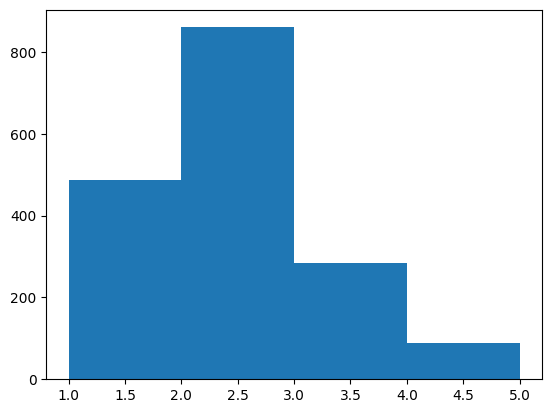

Max
2    860
1    486
3    285
4     85
0     41
5      3
Name: count, dtype: Int64

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

FORECAST_DF = pd.read_parquet(SAMPLE_DATA_PARQUET)
total_labels = len(FORECAST_DF)
total_labels_missing = len(FORECAST_DF[FORECAST_DF.isna().any(axis=1) | (FORECAST_DF["Max"] == 0)])
fraction_labels_missing = float(total_labels_missing) / total_labels

print(f"Total labels: {total_labels}")
print(f"Labels missing: {total_labels_missing}")
print(f"Fraction of labels missing: {fraction_labels_missing:.2%}")
print(f"Total labels minus missing: {total_labels - total_labels_missing}")
print(f"Number of seasons: {len(TARGET_SEASONS)}")

FORECAST_DF = FORECAST_DF.dropna(subset=["Max"])
np.histogram(FORECAST_DF["Max"])
plt.hist(FORECAST_DF["Max"], bins=range(1, 6))
plt.show()

FORECAST_DF["Max"].value_counts()

In [8]:
# Set hyperparameters
TOP_K_STATIONS = 5
LONG_TERM_DAYS = 14
MID_TERM_DAYS = 7
SHORT_TERM_DAYS = 3
LONG_TERM_HRS = 92 # 3 days + 20 hours for 8am current date back to 12pm 4 days before
SHORT_TERM_HRS = 3

In [9]:
# AWDB API Calls

from typing import Any
import os
import numpy as np
import pandas as pd
import requests
import certifi
import datetime
import time
from tqdm import tqdm
from pathlib import Path

# Cached feature tables (under offline_data/ with sample parquet)
SNOTEL_FEATURES_PARQUET = Path("offline_data/snotel_features.parquet")
SNOTEL_STATIONS_REF_PARQUET = Path("offline_data/snotel_stations_ref.parquet")

AWDB_BASE = "https://wcc.sc.egov.usda.gov/awdbRestApi"
# TLS: wcc.sc.egov.usda.gov often omits the intermediate in the chain; certifi alone can
# fail with "unable to get local issuer certificate". We merge certifi + DigiCert intermediate
# (see eda/certs/). Override with REQUESTS_CA_BUNDLE / SSL_CERT_FILE. Debug only: AWDB_VERIFY_SSL=0


def _awdb_tls_ca_bundle() -> str:
    if os.environ.get("REQUESTS_CA_BUNDLE"):
        return os.environ["REQUESTS_CA_BUNDLE"]
    if os.environ.get("SSL_CERT_FILE"):
        return os.environ["SSL_CERT_FILE"]

    # Look for the bundled DigiCert intermediate from cwd and parent dirs.
    extra = None
    roots = [Path.cwd(), *Path.cwd().parents]
    for root in roots:
        candidate = root / "eda/certs/DigiCertGlobalG2TLSRSASHA2562020CA1.pem"
        if candidate.exists():
            extra = candidate
            break
        candidate = root / "certs/DigiCertGlobalG2TLSRSASHA2562020CA1.pem"
        if candidate.exists():
            extra = candidate
            break

    if extra is None:
        return certifi.where()

    # Merged bundle lives next to other EDA parquet/cache (not repo-root offline_data/).
    out_dir = None
    for root in roots:
        if (root / "eda").is_dir():
            out_dir = root / "eda" / "offline_data"
            break
    if out_dir is None:
        out_dir = Path("eda/offline_data")
    out_dir.mkdir(parents=True, exist_ok=True)
    out = out_dir / "awdb_ca_bundle.pem"
    merged = Path(certifi.where()).read_text() + "\n" + extra.read_text()
    out.write_text(merged)
    return str(out.resolve())


AWDB_CA_BUNDLE = _awdb_tls_ca_bundle()
print(f"AWDB TLS bundle: {AWDB_CA_BUNDLE}")
AWDB_VERIFY_SSL = os.environ.get("AWDB_VERIFY_SSL", "true").lower() not in ("0", "false", "no")
if not AWDB_VERIFY_SSL:
    import urllib3

    urllib3.disable_warnings(urllib3.exceptions.InsecureRequestWarning)
# Responsible API use: identify the client (HEADERS from setup cell), bound waits, light pacing.
AWDB_REQUEST_TIMEOUT_SECONDS = REQUEST_TIMEOUT_SECONDS
AWDB_REQUEST_SLEEP_SECONDS = REQUEST_SLEEP_SECONDS

AWDB_CONNECT_TIMEOUT_SECONDS = int(os.environ.get("AWDB_CONNECT_TIMEOUT_SECONDS", "10"))
AWDB_READ_TIMEOUT_SECONDS = int(os.environ.get("AWDB_READ_TIMEOUT_SECONDS", "120"))
AWDB_DATA_READ_TIMEOUT_SECONDS = int(os.environ.get("AWDB_DATA_READ_TIMEOUT_SECONDS", "240"))

# Get forecast dates from sample data
# Dense calendar days per season: from first to last labeled forecast date in FORECAST_DF (per season).
# Matches weather coverage to the full in-season window, not only days with labels.
_wdf = FORECAST_DF.copy()
_wdf["date"] = pd.to_datetime(_wdf["date"], errors="coerce").dt.normalize()
_wdf = _wdf.dropna(subset=["date"])
if "season" not in _wdf.columns:
    if "season_label_from_date" not in globals():
        raise ValueError("FORECAST_DF missing 'season'; run labels cell or define season_label_from_date.")
    _wdf["season"] = _wdf["date"].map(season_label_from_date)
_seasons_ok = set(TARGET_SEASONS) if "TARGET_SEASONS" in globals() else None
_dense_dates = []
for _season, _g in _wdf.groupby("season", sort=False):
    if _seasons_ok is not None and _season not in _seasons_ok:
        continue
    _d0, _d1 = _g["date"].min(), _g["date"].max()
    _dense_dates.extend(pd.date_range(_d0, _d1, freq="D"))
if not _dense_dates:
    raise ValueError("No dates after per-season expansion; check FORECAST_DF / TARGET_SEASONS.")
FORECAST_DATES = pd.Series(sorted({pd.Timestamp(x).normalize() for x in _dense_dates})).sort_values()
print(
    f"Weather fetch dates (dense per season): {len(FORECAST_DATES)} calendar days "
    f"({FORECAST_DATES.iloc[0].date()} → {FORECAST_DATES.iloc[-1].date()})"
)

# Get current dates and times
day_delta = lambda x: datetime.timedelta(days=x)
NOW = datetime.date.today()
NOW_HR_AM = datetime.datetime.combine(NOW, datetime.time(hour=8, minute=0, second=0))
NOW_STR = datetime.datetime.strftime(NOW, "%Y-%m-%d")
NOW_HR_STR = datetime.datetime.strftime(NOW_HR_AM, "%Y-%m-%d %H:%M")

# Initialize headers
AWDB_HEADERS = {**HEADERS, "Accept": "application/json"}

# Initialize SNOTEL features dataframe
wteq_cols_days = [f"WTEQ[-{i}d]" for i in range(LONG_TERM_DAYS)]
snwd_cols_days = [f"SNWD[-{i}d]" for i in range(LONG_TERM_DAYS)]
prcp_cols_days = [f"PRCP[-{i}d]" for i in range(LONG_TERM_DAYS)]
prcpsa_cols_days = [f"PRCPSA[-{i}d]" for i in range(LONG_TERM_DAYS)]
tobs_cols_days = [f"TOBS[-{i}d]" for i in range(LONG_TERM_DAYS)]

wteq_cols_hours = [f"WTEQ[-{i}h]" for i in range(LONG_TERM_HRS)]
snwd_cols_hours = [f"SNWD[-{i}h]" for i in range(LONG_TERM_HRS)]
prcp_cols_hours = [f"PRCP[-{i}h]" for i in range(LONG_TERM_HRS)]
prcpsa_cols_hours = [f"PRCPSA[-{i}h]" for i in range(LONG_TERM_HRS)]
tobs_cols_hours = [f"TOBS[-{i}h]" for i in range(LONG_TERM_HRS)]

wteq_cols = wteq_cols_days + wteq_cols_hours
snwd_cols = snwd_cols_days + snwd_cols_hours
prcp_cols = prcp_cols_days + prcp_cols_hours
prcpsa_cols = prcpsa_cols_days + prcpsa_cols_hours
tobs_cols = tobs_cols_days + tobs_cols_hours

# forecast_date = avalanche label row date; stationTriplet keys into SNOTEL_STATIONS_REF for lat/lon/elev
feature_columns = ["forecast_date", "stationTriplet", *wteq_cols, *snwd_cols, *prcp_cols, *prcpsa_cols, *tobs_cols]

existing_snotel = pd.DataFrame()
if SNOTEL_FEATURES_PARQUET.exists():
    existing_snotel = pd.read_parquet(SNOTEL_FEATURES_PARQUET)
    if "forecast_date" not in existing_snotel.columns:
        print("Warning: snotel cache missing forecast_date; ignoring cached file. Remove it to rebuild with new schema.")
        existing_snotel = pd.DataFrame()
    else:
        existing_snotel["forecast_date"] = pd.to_datetime(existing_snotel["forecast_date"]).dt.normalize()

cached_forecast_dates = set(existing_snotel["forecast_date"].unique()) if not existing_snotel.empty else set()
pending_dates = [d for d in FORECAST_DATES if pd.Timestamp(d).normalize() not in cached_forecast_dates]
print(
    f"SNOTEL parquet cache: {len(cached_forecast_dates)} forecast dates on disk, "
    f"{len(pending_dates)} dates left to fetch"
)

# You will confirm exact endpoint/params in Swagger.
# Keep this as a wrapper so you can adjust once.
def _awdb_query_params(params: dict) -> dict:
    """AWDB expects comma-separated strings for multi-value params (OpenAPI: stationTriplets, elements).
    Passing Python lists would serialize as repeated keys and can trigger 500s on the server."""
    out = {}
    for key, val in params.items():
        if isinstance(val, (list, tuple)):
            out[key] = ",".join(str(x) for x in val)
        else:
            out[key] = val
    return out


def _chunks(xs, n: int):
    for i in range(0, len(xs), n):
        yield xs[i : i + n]


def awdb_get(endpoint: str, params: dict):
    """AWDB GET with retries + batching.

    Notes:
    - `services/v1/data` can be slow, especially HOURLY; we batch stationTriplets.
    - Uses separate connect/read timeouts to avoid hanging forever.
    """

    max_retries = 10
    base_pause = 5
    _no_proxy = {"http": None, "https": None}

    # Tune timeouts: data endpoints get a longer read timeout.
    read_timeout = AWDB_READ_TIMEOUT_SECONDS
    if endpoint.endswith('/data') or endpoint == 'services/v1/data':
        read_timeout = AWDB_DATA_READ_TIMEOUT_SECONDS
    timeout = (AWDB_CONNECT_TIMEOUT_SECONDS, read_timeout)

    def _one_call(p: dict):
        with requests.Session() as sess:
            sess.trust_env = False
            sess.proxies.update(_no_proxy)
            for attempt in range(max_retries):
                try:
                    r = sess.get(
                        f"{AWDB_BASE}/{endpoint}",
                        params=_awdb_query_params(p),
                        headers=AWDB_HEADERS,
                        timeout=timeout,
                        proxies=_no_proxy,
                        verify=AWDB_CA_BUNDLE if AWDB_VERIFY_SSL else False,
                    )
                except (requests.exceptions.ReadTimeout, requests.exceptions.ConnectTimeout):
                    pause = min(base_pause * (2**attempt), 120)
                    print(f"AWDB timeout on attempt {attempt+1}/{max_retries} for {endpoint}; sleeping {pause}s...")
                    time.sleep(pause)
                    continue
                except requests.exceptions.SSLError as e:
                    raise requests.exceptions.SSLError(
                        "TLS verification failed for AWDB. If you use a corporate proxy / SSL inspection, "
                        "set REQUESTS_CA_BUNDLE or SSL_CERT_FILE to a PEM that includes your org's issuing CA. "
                        "For local debugging only you may set AWDB_VERIFY_SSL=0. "
                        f"CA bundle was: {AWDB_CA_BUNDLE}. Original error: {e}"
                    ) from e

                if r.status_code != 500:
                    if not r.ok:
                        snippet = (r.text or "")[:500].replace("\n", " ")
                        raise requests.HTTPError(
                            f"{r.status_code} {r.reason} for {r.url}: {snippet}", response=r
                        )
                    return r.json()

                pause = min(base_pause * (2**attempt), 300)
                print(
                    f"AWDB 500 on attempt {attempt+1}/{max_retries} at '{endpoint}'. Sleeping {pause}s..."
                )
                time.sleep(pause)

            snippet = (r.text or "")[:500].replace("\n", " ") if 'r' in locals() and hasattr(r, 'text') else ''
            raise requests.HTTPError(
                f"Request failed for {endpoint} after {max_retries} retries: {snippet}", response=getattr(locals().get('r', None), 'response', None)
            )


    # Batch stationTriplets for the heavy data endpoint.
    if endpoint == 'services/v1/data' and isinstance(params.get('stationTriplets'), (list, tuple)):
        triplets = list(params['stationTriplets'])
        batch_size = int(os.environ.get('AWDB_STATION_BATCH_SIZE', '20'))
        out = []
        for batch in _chunks(triplets, batch_size):
            p = dict(params)
            p['stationTriplets'] = batch
            chunk = _one_call(p)
            if isinstance(chunk, list):
                out.extend(chunk)
            else:
                # Unexpected shape, just return it
                return chunk
            time.sleep(AWDB_REQUEST_SLEEP_SECONDS)
        return out

    return _one_call(params)

# Example pseudocode structure:
# stations = awdb_get("metadata/stations", {...})
# refs = awdb_get("reference-data/elements", {})
# series = awdb_get("data", {
#     "stationTriplets": "xxxx:CA:SNTL",
#     "elements": "WTEQ",
#     "duration": "DAILY",
#     "beginDate": "2025-12-01",
#     "endDate": "2026-03-01",
# })

stations_req_params = {"stationTriplets": "*:CA:SNTL",}
stations = awdb_get("services/v1/stations", stations_req_params)
time.sleep(AWDB_REQUEST_SLEEP_SECONDS)
key_func = lambda x: dist_elevation_score(x['latitude'], 
                                          x['longitude'], 
                                          x['elevation']*FT_TO_M,
                                          TEST_LAT, 
                                          TEST_LON,
                                          TEST_ELEV_M)
stations_sorted = sorted(stations, key=key_func)
top_k_stations_sorted = stations_sorted[:TOP_K_STATIONS]
# Reference table for the TOP_K stations (join feature rows on stationTriplet)
SNOTEL_STATIONS_REF = pd.DataFrame(
    [
        {
            "rank": i + 1,
            "stationTriplet": s["stationTriplet"],
            "name": s.get("name"),
            "latitude": s["latitude"],
            "longitude": s["longitude"],
            "elevation": s["elevation"],
        }
        for i, s in enumerate(top_k_stations_sorted)
    ]
)
top_k_station_triplets = [s["stationTriplet"] for s in top_k_stations_sorted]

SNOTEL_FEATURES_PARQUET.parent.mkdir(parents=True, exist_ok=True)
SNOTEL_STATIONS_REF.to_parquet(SNOTEL_STATIONS_REF_PARQUET, index=False)
print(f"Wrote station reference -> {SNOTEL_STATIONS_REF_PARQUET.resolve()}")

pprint.pprint(top_k_station_triplets)

# Reference Tags
# TOBS: Instantaneously Observed Air Temperature
# PRCP: Total Precipitation Increment
# PRCPSA: Snow Adjusted Total Preciptation Increment
# SNWD: Total Snow Depth
# WTEQ: Snow Water Equivalent - Depth of water that would theoretically result
#       if the entire snowpack were melted instantaneously
reference_codes = ["WTEQ", "SNWD", "PRCP", "PRCPSA", "TOBS"]
reference_codes_dict = {reference_codes[i]: i for i in range(len(reference_codes))}
references_req_params = {"referenceLists": "elements",}
reference_data = awdb_get("services/v1/reference-data", references_req_params)["elements"]
time.sleep(AWDB_REQUEST_SLEEP_SECONDS)

# Print units from the API for our codes
print("AWDB API element units:")
for element in reference_data:
    code = element.get("code")
    if code in reference_codes:
        unit_desc = element.get("storedUnitCode", "n/a")
        print(f"  {code}: {unit_desc}")

def _awdb_values_by_date(station_data: dict) -> dict[str, dict[str, Any]]:
    """
    For a given AWDB station data dictionary, produces a mapping from element code
    (e.g., 'WTEQ', 'SNWD', etc.) to a nested dictionary of the form:
        { 'YYYY-MM-DD': value }
    where each date string maps to its corresponding measurement value for that element.
    If multiple values for the same date exist, the last one present in the input data will overwrite any previous values.
    Only element codes included in the `reference_codes_dict` will be processed.
    """
    out: dict[str, dict[str, Any]] = {}
    for block in station_data.get("data", []):
        se = block.get("stationElement") or {}
        code = se.get("elementCode")
        if code not in reference_codes_dict:
            continue
        date_map = out.setdefault(code, {})
        for row in block.get("values") or []:
            dk = row.get("date")
            if dk is None:
                continue
            key = str(dk)[:10]
            date_map[key] = row.get("value")
    return out


def _awdb_values_by_hour(station_data: dict) -> dict[str, dict[pd.Timestamp, Any]]:
    """elementCode -> { hour-aligned Timestamp -> value }."""
    out: dict[str, dict[pd.Timestamp, Any]] = {}
    for block in station_data.get("data", []):
        se = block.get("stationElement") or {}
        code = se.get("elementCode")
        if code not in reference_codes_dict:
            continue
        mp = out.setdefault(code, {})
        for row in block.get("values") or []:
            dk = row.get("date")
            if dk is None:
                continue
            ts = pd.Timestamp(dk).floor("h")
            mp[ts] = row.get("value")
    return out


def awdb_data_to_df_rows(
    raw_day_data: list,
    raw_hour_data: list,
    target_date_ts: pd.Timestamp,
) -> list[list]:
    """One row per station for a forecast date: DAILY + HOURLY AWDB /data merged.

    Daily: WTEQ[-0d] = target_day; hourly: WTEQ[-0h] = 08:00 local clock on that day (anchor), ...[-91h].
    Lat/lon/elevation stay in SNOTEL_STATIONS_REF only.
    """
    target_day = pd.Timestamp(target_date_ts).normalize().date()
    target_hr_am = datetime.datetime.combine(target_day, datetime.time(hour=8, minute=0, second=0))
    anchor_ts = pd.Timestamp(target_hr_am).floor("h")
    forecast_ts = pd.Timestamp(target_date_ts).normalize()

    hour_by_triplet = {s["stationTriplet"]: s for s in raw_hour_data}
    rows: list[list] = []

    for station_day in raw_day_data:
        triplet = station_day["stationTriplet"]
        station_hour = hour_by_triplet.get(triplet, {"stationTriplet": triplet, "data": []})

        by_date = _awdb_values_by_date(station_day)
        by_hour = _awdb_values_by_hour(station_hour)

        row: list = [forecast_ts, triplet]
        for code in reference_codes:
            dm = by_date.get(code, {})
            for i in range(LONG_TERM_DAYS):
                d = target_day - datetime.timedelta(days=i)
                ds = d.strftime("%Y-%m-%d")
                row.append(dm.get(ds, np.nan))
            hm = by_hour.get(code, {})
            for i in range(LONG_TERM_HRS):
                ts = anchor_ts - pd.Timedelta(hours=i)
                row.append(hm.get(ts, np.nan))

        rows.append(row)
    return rows


new_snotel_chunks: list[pd.DataFrame] = []
snotel_features = existing_snotel.copy()  # Start from existing

for target_date_ts in tqdm(pending_dates, desc="Fetching SNOTEL features"):
    # Convert pandas timestamp to datetime
    target_date = target_date_ts.to_pydatetime()
    target_hr_am = datetime.datetime.combine(target_date, datetime.time(hour=8, minute=0, second=0))
    target_hr_str = datetime.datetime.strftime(target_hr_am, "%Y-%m-%d %H:%M")
    target_day_str = datetime.datetime.strftime(target_date, "%Y-%m-%d")

    day_window_start_str = datetime.datetime.strftime(target_date - day_delta(LONG_TERM_DAYS), "%Y-%m-%d")
    hr_window_start = target_hr_am - datetime.timedelta(hours=LONG_TERM_HRS)
    hr_window_start_str = hr_window_start.strftime("%Y-%m-%d %H:%M")

    day_data_params = {"stationTriplets": top_k_station_triplets,
                       "elements": reference_codes,
                       "duration": "DAILY",
                       "beginDate": day_window_start_str,
                       "endDate": target_day_str,
                       "periodRef": "START",
                       "centralTendencyType": "AVERAGE"}
    raw_day_data = awdb_get("services/v1/data", day_data_params)

    hour_data_params = {"stationTriplets": top_k_station_triplets,
                        "elements": reference_codes,
                        "duration": "HOURLY",
                        "beginDate": hr_window_start_str,
                        "endDate": target_hr_str,
                        "periodRef": "START",
                        "centralTendencyType": "AVERAGE"}
    raw_hour_data = awdb_get("services/v1/data", hour_data_params)

    rows = awdb_data_to_df_rows(raw_day_data, raw_hour_data, target_date_ts)
    new_chunk = pd.DataFrame(rows, columns=feature_columns)
    new_snotel_chunks.append(new_chunk)
    # Update our master DataFrame, drop dups, sort, and save each iteration
    snotel_features = pd.concat([snotel_features, new_chunk], ignore_index=True)
    snotel_features = snotel_features.drop_duplicates(subset=["forecast_date", "stationTriplet"], keep="last")
    snotel_features = snotel_features.sort_values(["forecast_date", "stationTriplet"]).reset_index(drop=True)
    if not snotel_features.empty:
        snotel_features.to_parquet(SNOTEL_FEATURES_PARQUET, index=False)
    time.sleep(AWDB_REQUEST_SLEEP_SECONDS)

if not new_snotel_chunks:
    # fallback if none added
    snotel_features = existing_snotel

if not snotel_features.empty:
    snotel_features.to_parquet(SNOTEL_FEATURES_PARQUET, index=False)
    print(f"Wrote SNOTEL features -> {SNOTEL_FEATURES_PARQUET.resolve()} ({len(snotel_features)} rows)")

print("SNOTEL station reference (join snotel_features on stationTriplet + forecast_date):")
print(SNOTEL_STATIONS_REF.to_string(index=False))
snotel_features


AWDB TLS bundle: /Users/chadcasper/Documents/MLOps Zoomcamp/avalanche-danger-prediction/eda/offline_data/awdb_ca_bundle.pem
Weather fetch dates (dense per season): 2119 calendar days (2014-09-26 → 2026-04-14)
SNOTEL parquet cache: 2119 forecast dates on disk, 0 dates left to fetch
Wrote station reference -> /Users/chadcasper/Documents/MLOps Zoomcamp/avalanche-danger-prediction/eda/offline_data/snotel_stations_ref.parquet
['428:CA:SNTL', '541:CA:SNTL', '539:CA:SNTL', '540:CA:SNTL', '834:CA:SNTL']
AWDB API element units:
  TOBS: degF
  PRCP: in
  PRCPSA: in
  SNWD: in
  WTEQ: in


Fetching SNOTEL features: 0it [00:00, ?it/s]

Wrote SNOTEL features -> /Users/chadcasper/Documents/MLOps Zoomcamp/avalanche-danger-prediction/eda/offline_data/snotel_features.parquet (10595 rows)
SNOTEL station reference (join snotel_features on stationTriplet + forecast_date):
 rank stationTriplet               name  latitude  longitude  elevation
    1    428:CA:SNTL            Css Lab  39.32565 -120.36807     6890.0
    2    541:CA:SNTL  Independence Lake  39.42752 -120.31342     8340.0
    3    539:CA:SNTL  Independence Camp  39.45269 -120.29367     6970.0
    4    540:CA:SNTL Independence Creek  39.49001 -120.28226     6440.0
    5    834:CA:SNTL         Truckee #2  39.30087 -120.18407     6500.0


,forecast_date,stationTriplet,WTEQ[-0d],WTEQ[-1d],WTEQ[-2d],WTEQ[-3d],WTEQ[-4d],WTEQ[-5d],WTEQ[-6d],WTEQ[-7d],...,TOBS[-82h],TOBS[-83h],TOBS[-84h],TOBS[-85h],TOBS[-86h],TOBS[-87h],TOBS[-88h],TOBS[-89h],TOBS[-90h],TOBS[-91h]
0,2014-09-26,428:CA:SNTL,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,46.6,48.2,50.5,55.0,58.8,62.1,64.6,65.7,68.0,67.3
1,2014-09-26,539:CA:SNTL,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,47.1,47.3,49.5,52.9,59.2,61.0,63.7,66.0,67.1,67.6
2,2014-09-26,540:CA:SNTL,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,42.3,44.1,47.3,51.6,59.0,64.0,67.3,70.3,71.2,71.2
3,2014-09-26,541:CA:SNTL,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,51.8,52.5,50.9,50.9,52.2,54.1,59.0,60.8,63.0,63.3
4,2014-09-26,834:CA:SNTL,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,54.1,53.2,55.2,56.5,60.4,64.0,68.2,69.1,72.0,69.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10590,2026-04-14,428:CA:SNTL,3.8,4.0,2.1,0.4,0.0,0.0,0.4,0.6,...,32.2,32.9,33.3,32.9,32.2,34.2,33.1,32.7,32.4,32.7
10591,2026-04-14,539:CA:SNTL,1.5,1.8,0.8,0.2,0.0,0.0,0.0,0.0,...,35.2,35.6,36.1,36.1,34.2,37.6,33.8,33.4,36.1,36.3
10592,2026-04-14,540:CA:SNTL,1.2,1.3,0.5,0.0,0.0,0.0,0.0,0.0,...,35.1,35.6,35.8,36.0,36.0,36.9,34.7,35.6,37.0,38.8
10593,2026-04-14,541:CA:SNTL,22.4,22.4,20.7,19.0,18.2,18.4,18.7,18.9,...,28.4,28.9,28.9,29.1,30.0,30.7,30.7,30.7,31.5,31.5


In [10]:
# Open-Meteo API — windowed weather features per labeled forecast date
# pip: openmeteo-requests, requests-cache, retry-requests (see requirements.txt)
from pathlib import Path

import openmeteo_requests
import pandas as pd
import requests_cache
from retry_requests import retry

OPEN_METEO_ARCHIVE_URL = "https://archive-api.open-meteo.com/v1/archive"
OM_CACHE_DIR = Path("offline_data/open_meteo_cache")
OM_CACHE_DIR.mkdir(parents=True, exist_ok=True)

# Match Open-Meteo variable order to extraction below
DAILY_VARIABLES = [
    "temperature_2m_mean",
    "temperature_2m_max",
    "temperature_2m_min",
    "snowfall_water_equivalent_sum",
    "precipitation_sum",
    "rain_sum",
    "snowfall_sum",
    "wind_speed_10m_max",
    "wind_gusts_10m_max",
    "wind_direction_10m_dominant",
    "shortwave_radiation_sum",
]
HOURLY_VARIABLES_BASE = [
    "temperature_2m",
    "precipitation",
    "rain",
    "snowfall",
    "snow_depth",
    "cloud_cover_low",
    "cloud_cover_mid",
    "cloud_cover_high",
    "cloud_cover",
    "relative_humidity_2m",
    "dew_point_2m",
    "wind_speed_10m",
    "wind_direction_10m",
    "wind_gusts_10m",
    "wet_bulb_temperature_2m",
]


def _open_meteo_cerra_domain(lat: float, lon: float) -> bool:
    """Rough CERRA coverage (Europe). Outside this box, do not pass models=cerra (API may 400)."""
    return 34.0 <= lat <= 72.0 and -12.0 <= lon <= 40.0


# Labeled forecast dates
if (
    "FORECAST_DF" not in globals()
    or not isinstance(FORECAST_DF, pd.DataFrame)
    or FORECAST_DF.empty
    or "date" not in FORECAST_DF.columns
):
    raise ValueError("Run the FORECAST_DF cell first; it must contain a non-empty 'date' column.")

# Same dense per-season calendar coverage as the SNOTEL cell (first→last label day per season).
_om_wdf = FORECAST_DF.copy()
_om_wdf["date"] = pd.to_datetime(_om_wdf["date"], errors="coerce").dt.normalize()
_om_wdf = _om_wdf.dropna(subset=["date"])
if "season" not in _om_wdf.columns:
    if "season_label_from_date" not in globals():
        raise ValueError("FORECAST_DF missing 'season'; run labels cell or define season_label_from_date.")
    _om_wdf["season"] = _om_wdf["date"].map(season_label_from_date)
_om_seasons_ok = set(TARGET_SEASONS) if "TARGET_SEASONS" in globals() else None
_om_dense = []
for _season, _g in _om_wdf.groupby("season", sort=False):
    if _om_seasons_ok is not None and _season not in _om_seasons_ok:
        continue
    _d0, _d1 = _g["date"].min(), _g["date"].max()
    _om_dense.extend(pd.date_range(_d0, _d1, freq="D"))
if not _om_dense:
    raise ValueError("No dates after per-season expansion; check FORECAST_DF / TARGET_SEASONS.")
label_dates = pd.Series(sorted({pd.Timestamp(x).normalize() for x in _om_dense})).sort_values()

# Window lengths: match SNOTEL `LONG_TERM_*` (defined in earlier cells) — [-0d]/[-0h] = target forecast date / 8am anchor.
_LONG_TERM_DAYS = int(globals().get("LONG_TERM_DAYS", 14))
_LONG_TERM_HRS = int(globals().get("LONG_TERM_HRS", 92))
# Raw archive must cover the farthest lookback: max daily offset is (LONG_TERM_DAYS-1) days; hourly spans ceil((LONG_TERM_HRS-1)/24) days from the anchor.
_api_lookback_days = max(_LONG_TERM_DAYS - 1, ((_LONG_TERM_HRS - 1) + 23) // 24)
api_start = (label_dates.min() - pd.Timedelta(days=_api_lookback_days)).strftime("%Y-%m-%d")
api_end = label_dates.max().strftime("%Y-%m-%d")

_cerra = _open_meteo_cerra_domain(float(TEST_LAT), float(TEST_LON))
HOURLY_VARIABLES = list(HOURLY_VARIABLES_BASE)
if _cerra:
    # CERRA-only hourly variable; omit outside European domain (no null column / extra meta request).
    HOURLY_VARIABLES.append("snow_depth_water_equivalent")

# Setup client: persistent cache + retries (polite to Open-Meteo)
cache_session = requests_cache.CachedSession(str(OM_CACHE_DIR / "http"), expire_after=-1)
retry_session = retry(cache_session, retries=5, backoff_factor=0.2)
openmeteo = openmeteo_requests.Client(session=retry_session)

params = {
    "latitude": TEST_LAT,
    "longitude": TEST_LON,
    "start_date": api_start,
    "end_date": api_end,
    "daily": DAILY_VARIABLES,
    "hourly": HOURLY_VARIABLES,
}
if _cerra:
    params["models"] = "cerra"
    print("Using models=cerra — hourly snow_depth_water_equivalent requested (CERRA / Europe).")

responses = openmeteo.weather_api(OPEN_METEO_ARCHIVE_URL, params=params)
response = responses[0]

lat, lon = response.Latitude(), response.Longitude()
lat_h = f"{lat:.5f}N" if lat >= 0 else f"{-lat:.5f}S"
lon_h = f"{lon:.5f}E" if lon >= 0 else f"{-lon:.5f}W"
print(f"Coordinates: {lat_h} {lon_h}")
print(f"Elevation: {response.Elevation()} m asl")
print(f"Timezone offset from UTC: {response.UtcOffsetSeconds()} s")
print(f"Archive fetch window: {api_start} to {api_end}")
print(f"Label dates: {len(label_dates)}")

# Raw hourly table
hourly = response.Hourly()
hourly_raw = {
    "date": pd.date_range(
        start=pd.to_datetime(hourly.Time(), unit="s", utc=True),
        end=pd.to_datetime(hourly.TimeEnd(), unit="s", utc=True),
        freq=pd.Timedelta(seconds=hourly.Interval()),
        inclusive="left",
    )
}
for i, name in enumerate(HOURLY_VARIABLES):
    hourly_raw[name] = hourly.Variables(i).ValuesAsNumpy()
hourly_raw_df = pd.DataFrame(hourly_raw)

# Raw daily table
daily = response.Daily()
daily_raw = {
    "date": pd.date_range(
        start=pd.to_datetime(daily.Time(), unit="s", utc=True),
        end=pd.to_datetime(daily.TimeEnd(), unit="s", utc=True),
        freq=pd.Timedelta(seconds=daily.Interval()),
        inclusive="left",
    )
}
for i, name in enumerate(DAILY_VARIABLES):
    daily_raw[name] = daily.Variables(i).ValuesAsNumpy()
daily_raw_df = pd.DataFrame(daily_raw)

# --- Imperial units: driven by Open-Meteo `daily_units` / `hourly_units` in JSON ---
# Adding variables to DAILY_VARIABLES / HOURLY_VARIABLES is enough: we map API unit strings → converters.
# One small JSON request (single day, same session cache) to read unit metadata; full time series still comes from the openmeteo client above.
def _c_to_f(s):
    return s * 9.0 / 5.0 + 32.0


def _mm_to_in(s):
    return s / 25.4


def _cm_to_in(s):
    return s / 2.54


def _m_to_in(s):
    return s * 39.37007874015748


def _kmh_to_mph(s):
    return s * 0.621371192237334


def _ms_to_mph(s):
    return s * 2.2369362920544


def _mj_m2_to_btu_ft2(s):
    return s * 88.0570518639


def _hpa_to_inhg(s):
    return s * 0.029529983071445


def _identity(s):
    return s


def _converter_for_openmeteo_unit(unit: str):
    """Return a Series transform, or None if column should not be converted."""
    if unit is None:
        return None
    u = unit.strip()
    if u in ("", "iso8601", "undefined"):
        return None
    mapping = {
        "°C": _c_to_f,
        "℃": _c_to_f,
        "°F": _identity,
        "mm": _mm_to_in,
        "cm": _cm_to_in,
        "m": _m_to_in,
        "km/h": _kmh_to_mph,
        "m/s": _ms_to_mph,
        "MJ/m²": _mj_m2_to_btu_ft2,
        "hPa": _hpa_to_inhg,
        "%": _identity,
        "°": _identity,
    }
    if u in mapping:
        return mapping[u]
    print(f"Warning: unknown Open-Meteo unit {u!r} — leaving values unchanged. Add a mapping if needed.")
    return _identity


_meta_params = {
    "latitude": TEST_LAT,
    "longitude": TEST_LON,
    "start_date": api_end,
    "end_date": api_end,
    "daily": ",".join(DAILY_VARIABLES),
    "hourly": ",".join(HOURLY_VARIABLES),
}
if "models" in params:
    _meta_params["models"] = params["models"]
_meta = retry_session.get(OPEN_METEO_ARCHIVE_URL, params=_meta_params, timeout=60)
_meta.raise_for_status()
_unit_meta = _meta.json()
_daily_units = _unit_meta.get("daily_units", {}) or {}
_hourly_units = _unit_meta.get("hourly_units", {}) or {}

_applied = []
for col in DAILY_VARIABLES:
    fn = _converter_for_openmeteo_unit(_daily_units.get(col))
    if fn is not None and col in daily_raw_df.columns:
        daily_raw_df[col] = fn(daily_raw_df[col])
        _applied.append(f"daily:{col}({_daily_units.get(col)})")
for col in HOURLY_VARIABLES:
    fn = _converter_for_openmeteo_unit(_hourly_units.get(col))
    if fn is not None and col in hourly_raw_df.columns:
        hourly_raw_df[col] = fn(hourly_raw_df[col])
        _applied.append(f"hourly:{col}({_hourly_units.get(col)})")

if _applied:
    tail = "; …" if len(_applied) > 12 else ""
    print(
        "Converted Open-Meteo series to imperial using API unit tags:",
        "; ".join(_applied[:12]) + tail,
    )
else:
    print("No daily/hourly columns converted (check DAILY_VARIABLES / HOURLY_VARIABLES).")

# Build fast lookup tables on LOCAL CLOCK time to match forecast labels.
# Open-Meteo returns UTC timestamps; shift by reported UTC offset first.
utc_offset = pd.Timedelta(seconds=response.UtcOffsetSeconds())
daily_dates_local = (daily_raw_df["date"] + utc_offset).dt.tz_localize(None)
hourly_dates_local = (hourly_raw_df["date"] + utc_offset).dt.tz_localize(None)

# Daily lookup keys: local calendar date
daily_lookup = {
    var: {pd.Timestamp(ts).date(): val for ts, val in zip(daily_dates_local, daily_raw_df[var])}
    for var in DAILY_VARIABLES
}
# Hourly lookup keys: exact local clock hour
hourly_lookup = {
    var: {pd.Timestamp(ts).floor("h"): val for ts, val in zip(hourly_dates_local, hourly_raw_df[var])}
    for var in HOURLY_VARIABLES
}

# Derived daily snow depth from raw hourly OM: full-day (24h) mean on local calendar day.
# `snow_depth` is already in inches after unit conversion above.
snow_depth_daily_mean_lookup = {}
if "snow_depth" in hourly_raw_df.columns:
    _hourly_local = pd.DataFrame({
        "local_ts": hourly_dates_local,
        "snow_depth": hourly_raw_df["snow_depth"],
    }).dropna(subset=["local_ts"])
    _hourly_local["local_day"] = _hourly_local["local_ts"].dt.date
    _snow_depth_daily_mean = _hourly_local.groupby("local_day", as_index=True)["snow_depth"].mean()
    snow_depth_daily_mean_lookup = _snow_depth_daily_mean.to_dict()

# Windowed daily features: one row per forecast label date; offsets [-0d..-(LONG_TERM_DAYS-1)d] (same indexing as SNOTEL daily columns).
daily_rows = []
for label_dt in label_dates:
    label_day = pd.Timestamp(label_dt).date()
    row = {"forecast_date": pd.Timestamp(label_dt)}
    for var in DAILY_VARIABLES:
        for i in range(_LONG_TERM_DAYS):
            d = (pd.Timestamp(label_day) - pd.Timedelta(days=i)).date()
            row[f"{var}[-{i}d]"] = daily_lookup[var].get(d, pd.NA)

    # Daily snow depth feature derived from hourly raw OM values.
    for i in range(_LONG_TERM_DAYS):
        d = (pd.Timestamp(label_day) - pd.Timedelta(days=i)).date()
        row[f"snow_depth_daily_mean_24h[-{i}d]"] = snow_depth_daily_mean_lookup.get(d, pd.NA)

    daily_rows.append(row)

daily_dataframe = pd.DataFrame(daily_rows)

# Windowed hourly features: offsets [-0h..-(LONG_TERM_HRS-1)h] vs 8am anchor on the label date (-0h = 08:00 that day; same indexing as SNOTEL hourly columns).
hourly_rows = []
for label_dt in label_dates:
    label_ts = pd.Timestamp(label_dt).normalize()
    anchor_8am = label_ts + pd.Timedelta(hours=8)
    row = {"forecast_date": label_ts}
    for var in HOURLY_VARIABLES:
        for i in range(_LONG_TERM_HRS):
            ts = anchor_8am - pd.Timedelta(hours=i)
            row[f"{var}[-{i}h]"] = hourly_lookup[var].get(ts, pd.NA)
    hourly_rows.append(row)

hourly_dataframe = pd.DataFrame(hourly_rows)

print("\nWindowed daily shape:", daily_dataframe.shape)
print("Windowed hourly shape:", hourly_dataframe.shape)
print("\nWindowed daily (head)")
print(daily_dataframe.head())
print("\nWindowed hourly (head)")
print(hourly_dataframe.head())

# Persist for downstream ML / offline use
out_dir = Path("offline_data")
out_dir.mkdir(parents=True, exist_ok=True)
daily_path = out_dir / "open_meteo_daily_windowed.parquet"
hourly_path = out_dir / "open_meteo_hourly_windowed.parquet"
raw_daily_path = out_dir / "open_meteo_daily_raw.parquet"
raw_hourly_path = out_dir / "open_meteo_hourly_raw.parquet"

daily_dataframe.to_parquet(daily_path, index=False)
hourly_dataframe.to_parquet(hourly_path, index=False)
daily_raw_df.to_parquet(raw_daily_path, index=False)
hourly_raw_df.to_parquet(raw_hourly_path, index=False)

print(f"\nWrote {daily_path.resolve()} ({len(daily_dataframe)} rows)")
print(f"Wrote {hourly_path.resolve()} ({len(hourly_dataframe)} rows)")
print(f"Wrote {raw_daily_path.resolve()} ({len(daily_raw_df)} rows)")
print(f"Wrote {raw_hourly_path.resolve()} ({len(hourly_raw_df)} rows)")

# hourly_dataframe, daily_dataframe

Coordinates: 39.33216N 120.41379W
Elevation: 2410.0 m asl
Timezone offset from UTC: 0 s
Archive fetch window: 2014-09-13 to 2026-04-14
Label dates: 2119
Converted Open-Meteo series to imperial using API unit tags: daily:temperature_2m_mean(°C); daily:temperature_2m_max(°C); daily:temperature_2m_min(°C); daily:snowfall_water_equivalent_sum(mm); daily:precipitation_sum(mm); daily:rain_sum(mm); daily:snowfall_sum(cm); daily:wind_speed_10m_max(km/h); daily:wind_gusts_10m_max(km/h); daily:wind_direction_10m_dominant(°); daily:shortwave_radiation_sum(MJ/m²); hourly:temperature_2m(°C); …

Windowed daily shape: (2119, 169)
Windowed hourly shape: (2119, 1381)

Windowed daily (head)
  forecast_date  temperature_2m_mean[-0d]  temperature_2m_mean[-1d]  \
0    2014-09-26                 39.794601                 47.170849   
1    2014-09-27                 40.057098                 39.794601   
2    2014-09-28                 37.754601                 40.057098   
3    2014-09-29                 43

## TODO: snowpack ledger

Eventually we want a season-long record of snowpack (SWE / SNWD, cumulative snowfall) and how weather evolved it — a "snowpack ledger." That history matters for persistent-slab / deep-instability risk that can lag storms by weeks to months.

Not implemented in this pass: no seasonal series, no winter-to-date scalars, and TimesFM context stays at 13 daily days (plus XGBoost's separate 80-hour block).


In [11]:
# Compare & analyze data features and labels
# Get snotel data
existing_snotel = pd.read_parquet(SNOTEL_FEATURES_PARQUET)
# Get simulation data
hourly_dataframe = pd.read_parquet(hourly_path)
daily_dataframe = pd.read_parquet(daily_path)
import re

print("DataFrame shapes:")
print(f"  existing_snotel:   {existing_snotel.shape}")
print(f"  hourly (sim):      {hourly_dataframe.shape}")
print(f"  daily (sim):       {daily_dataframe.shape}")
print(f"  FORECAST_DF:       {FORECAST_DF.shape}")

_n_daily_vars = len(globals().get("DAILY_VARIABLES", []) or [])
_n_hourly_vars = len(globals().get("HOURLY_VARIABLES", []) or [])
_lt_days = int(globals().get("LONG_TERM_DAYS", globals().get("_LONG_TERM_DAYS", 14)))
_lt_hrs = int(globals().get("LONG_TERM_HRS", globals().get("_LONG_TERM_HRS", 92)))
SNOTEL_N_SERIES = 5  # WTEQ, SNWD, PRCP, PRCPSA, TOBS
_day_lag = re.compile(r"\[-\d+d\]$")
_hr_lag = re.compile(r"\[-\d+h\]$")

print("\nFeature column count / #features → window length (expect LONG_TERM_DAYS or LONG_TERM_HRS):")
if _n_daily_vars:
    _d_feat = len([c for c in daily_dataframe.columns if c != "forecast_date"])
    print(f"  daily (sim):     {_d_feat} / {_n_daily_vars} = {_d_feat / _n_daily_vars}  (LONG_TERM_DAYS={_lt_days})")
else:
    print("  daily (sim):     (define DAILY_VARIABLES — run upstream cells)")
if _n_hourly_vars:
    _h_feat = len([c for c in hourly_dataframe.columns if c != "forecast_date"])
    print(f"  hourly (sim):    {_h_feat} / {_n_hourly_vars} = {_h_feat / _n_hourly_vars}  (LONG_TERM_HRS={_lt_hrs})")
else:
    print("  hourly (sim):    (define HOURLY_VARIABLES — run upstream cells)")

_s_d = [c for c in existing_snotel.columns if _day_lag.search(c)]
_s_h = [c for c in existing_snotel.columns if _hr_lag.search(c)]
print(f"  snotel (daily):  {len(_s_d)} / {SNOTEL_N_SERIES} = {len(_s_d) / SNOTEL_N_SERIES}  (LONG_TERM_DAYS={_lt_days})")
print(f"  snotel (hourly): {len(_s_h)} / {SNOTEL_N_SERIES} = {len(_s_h) / SNOTEL_N_SERIES}  (LONG_TERM_HRS={_lt_hrs})")

_fd_d = [c for c in FORECAST_DF.columns if _day_lag.search(c)]
_fd_h = [c for c in FORECAST_DF.columns if _hr_lag.search(c)]
if _fd_d or _fd_h:
    if _fd_d and _n_daily_vars:
        print(f"  FORECAST_DF (d): {len(_fd_d)} / {_n_daily_vars} = {len(_fd_d) / _n_daily_vars}")
    elif _fd_d:
        print(f"  FORECAST_DF (d): {len(_fd_d)} lag cols (DAILY_VARIABLES unset)")
    if _fd_h and _n_hourly_vars:
        print(f"  FORECAST_DF (h): {len(_fd_h)} / {_n_hourly_vars} = {len(_fd_h) / _n_hourly_vars}")
    elif _fd_h:
        print(f"  FORECAST_DF (h): {len(_fd_h)} lag cols (HOURLY_VARIABLES unset)")
else:
    print("  FORECAST_DF:     no [-Nd]/[-Nh] feature columns (labels/metadata only)")

print(f"\nLength of all the dataframes: snotel: {int(len(existing_snotel)/len(SNOTEL_STATIONS_REF))}, simulation hourly: {len(hourly_dataframe)}, simulation daily: {len(daily_dataframe)}, forecast: {len(FORECAST_DF)}")

def get_date_range(df, date_cols):
    for col in date_cols:
        if col in df.columns:
            dates = pd.to_datetime(df[col], errors='coerce').dropna()
            if len(dates):
                return dates.min(), dates.max()
    return None, None

snotel_start, snotel_end = get_date_range(existing_snotel, ['date', 'forecast_date'])
hourly_start, hourly_end = get_date_range(hourly_dataframe, ['forecast_date', 'date'])
daily_start, daily_end = get_date_range(daily_dataframe, ['forecast_date', 'date'])
forecast_start, forecast_end = get_date_range(FORECAST_DF, ['forecast_date', 'date'])

print("\nDate ranges:")
print(f"SNOTEL:   {snotel_start} to {snotel_end}")
print(f"Hourly:   {hourly_start} to {hourly_end}")
print(f"Daily:    {daily_start} to {daily_end}")
print(f"Forecast: {forecast_start} to {forecast_end}")

# Print base column names set (without [-Nd] or [-Nh] suffix) of each data frame, where N is a integer
print("\nSet of base column names (without [-Nd] or [-Nh] suffix) of each data frame, where N is a integer:")

# Simplified: just remove any pattern like '[-Nd]' or '[-Nh]' at the end of the column names, regardless of N
import re

def strip_lag_suffix(columns):
    # Remove lag suffixes of format '[-Nd]' or '[-Nh]' at the end of the column name
    return columns.str.replace(r'\[-\d+[dh]\]$', '', regex=True).unique()

print(f"existing_snotel: {list(set(strip_lag_suffix(existing_snotel.columns)))}")
print(f"hourly_dataframe: {list(set(strip_lag_suffix(hourly_dataframe.columns)))}")
print(f"daily_dataframe: {list(set(strip_lag_suffix(daily_dataframe.columns)))}")

# Print the columns of each data frame
print("\nColumns of each data frame:")
print(f"existing_snotel: {existing_snotel.columns}")
print(f"hourly_dataframe: {hourly_dataframe.columns}")
print(f"daily_dataframe: {daily_dataframe.columns}")
print(f"FORECAST_DF: {FORECAST_DF.columns}")


DataFrame shapes:
  existing_snotel:   (10595, 532)
  hourly (sim):      (2119, 1381)
  daily (sim):       (2119, 169)
  FORECAST_DF:       (1760, 6)

Feature column count / #features → window length (expect LONG_TERM_DAYS or LONG_TERM_HRS):
  daily (sim):     168 / 11 = 15.272727272727273  (LONG_TERM_DAYS=14)
  hourly (sim):    1380 / 15 = 92.0  (LONG_TERM_HRS=92)
  snotel (daily):  70 / 5 = 14.0  (LONG_TERM_DAYS=14)
  snotel (hourly): 460 / 5 = 92.0  (LONG_TERM_HRS=92)
  FORECAST_DF:     no [-Nd]/[-Nh] feature columns (labels/metadata only)

Length of all the dataframes: snotel: 2119, simulation hourly: 2119, simulation daily: 2119, forecast: 1760

Date ranges:
SNOTEL:   2014-09-26 00:00:00 to 2026-04-14 00:00:00
Hourly:   2014-09-26 00:00:00 to 2026-04-14 00:00:00
Daily:    2014-09-26 00:00:00 to 2026-04-14 00:00:00
Forecast: 2014-09-26 00:00:00 to 2026-04-14 00:00:00

Set of base column names (without [-Nd] or [-Nh] suffix) of each data frame, where N is a integer:
existing_snotel:

Overlapping winters: 14/15, 15/16, 16/17, 17/18, 18/19, 19/20, 20/21, 21/22, 22/23, 23/24, 24/25, 25/26


/var/folders/5g/ztyp6rl54tl1g18fgb56fvx80000gn/T/ipykernel_21868/1971618870.py:626: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0.06, 0.035, 0.94, 0.993], pad=0.35, h_pad=0.9, w_pad=0.7)


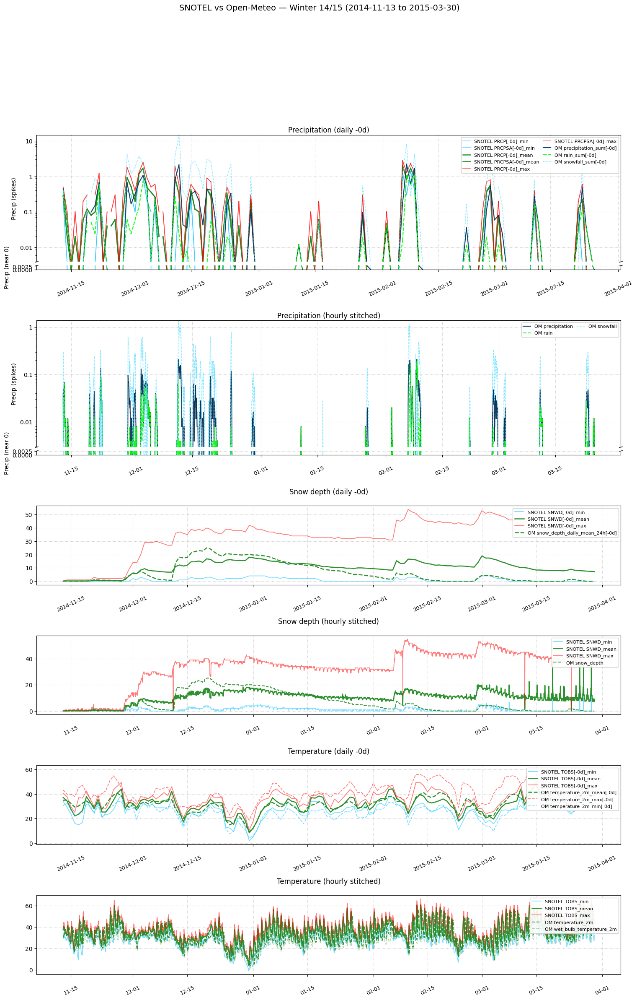

/var/folders/5g/ztyp6rl54tl1g18fgb56fvx80000gn/T/ipykernel_21868/1971618870.py:626: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0.06, 0.035, 0.94, 0.993], pad=0.35, h_pad=0.9, w_pad=0.7)


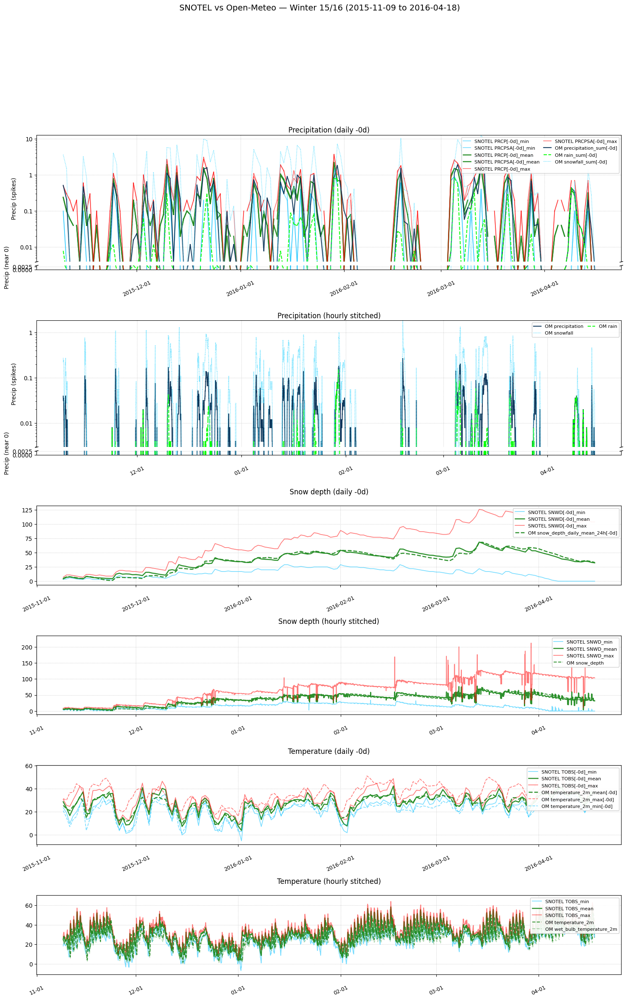

/var/folders/5g/ztyp6rl54tl1g18fgb56fvx80000gn/T/ipykernel_21868/1971618870.py:626: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0.06, 0.035, 0.94, 0.993], pad=0.35, h_pad=0.9, w_pad=0.7)


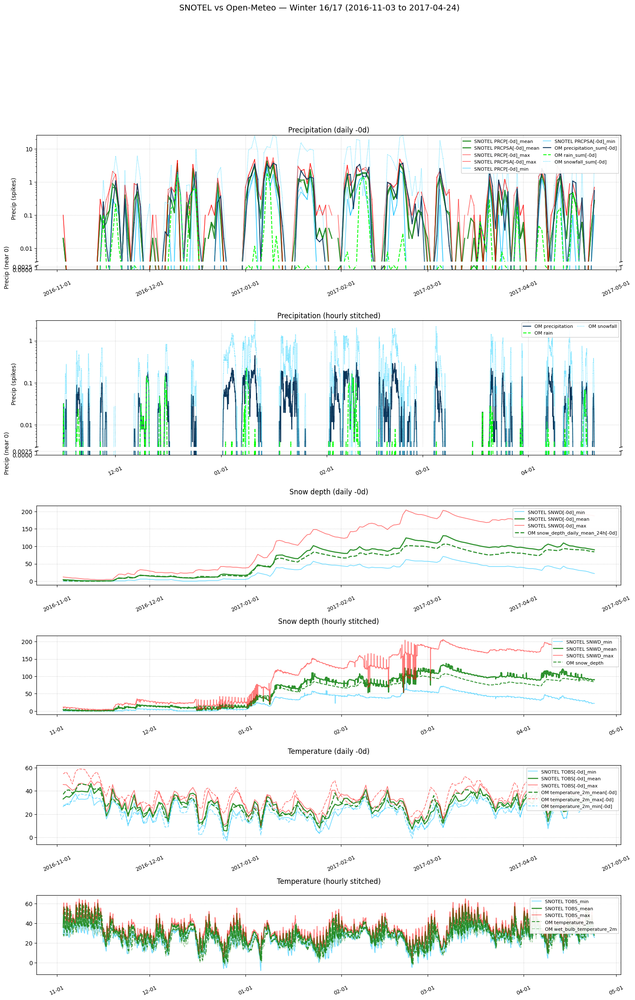

/var/folders/5g/ztyp6rl54tl1g18fgb56fvx80000gn/T/ipykernel_21868/1971618870.py:626: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0.06, 0.035, 0.94, 0.993], pad=0.35, h_pad=0.9, w_pad=0.7)


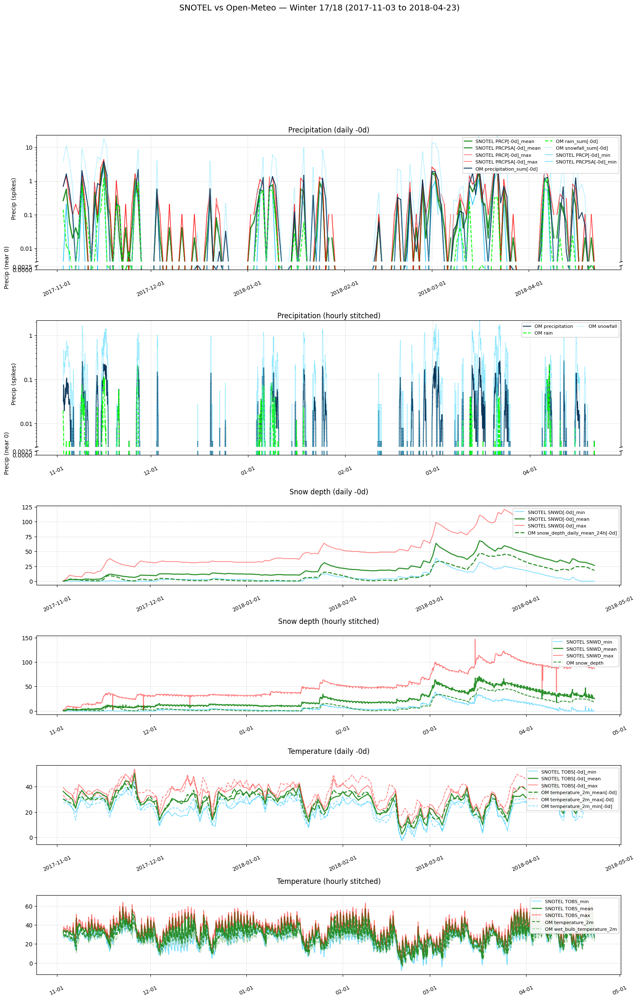

/var/folders/5g/ztyp6rl54tl1g18fgb56fvx80000gn/T/ipykernel_21868/1971618870.py:626: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0.06, 0.035, 0.94, 0.993], pad=0.35, h_pad=0.9, w_pad=0.7)


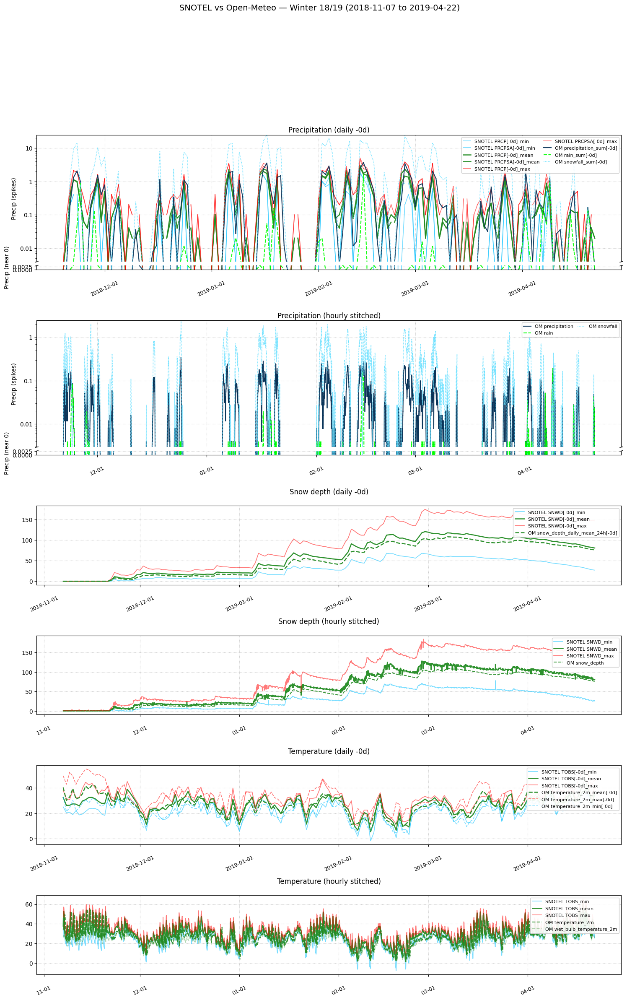

/var/folders/5g/ztyp6rl54tl1g18fgb56fvx80000gn/T/ipykernel_21868/1971618870.py:626: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0.06, 0.035, 0.94, 0.993], pad=0.35, h_pad=0.9, w_pad=0.7)


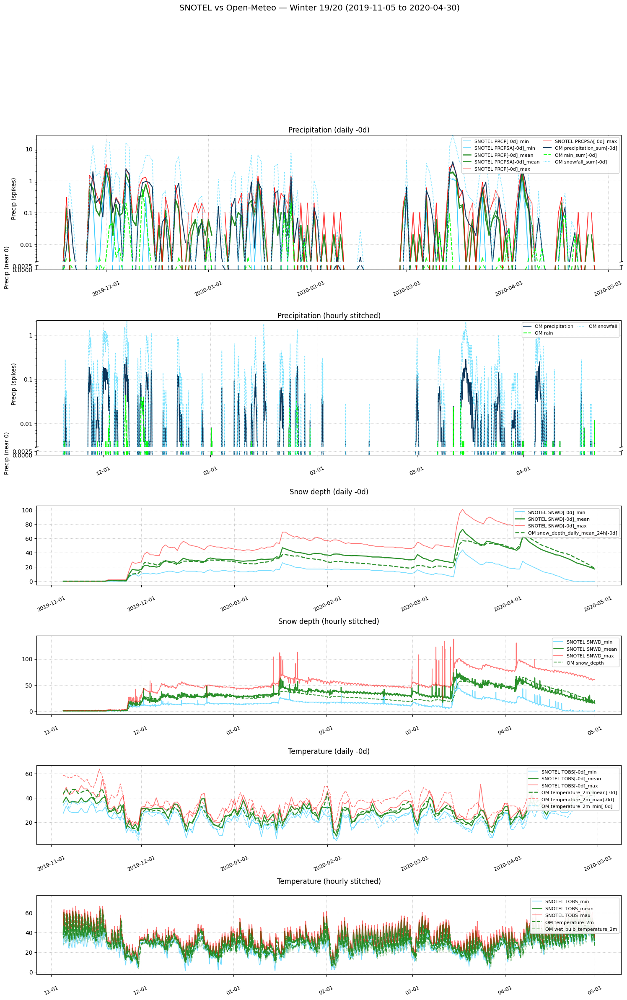

/var/folders/5g/ztyp6rl54tl1g18fgb56fvx80000gn/T/ipykernel_21868/1971618870.py:626: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0.06, 0.035, 0.94, 0.993], pad=0.35, h_pad=0.9, w_pad=0.7)


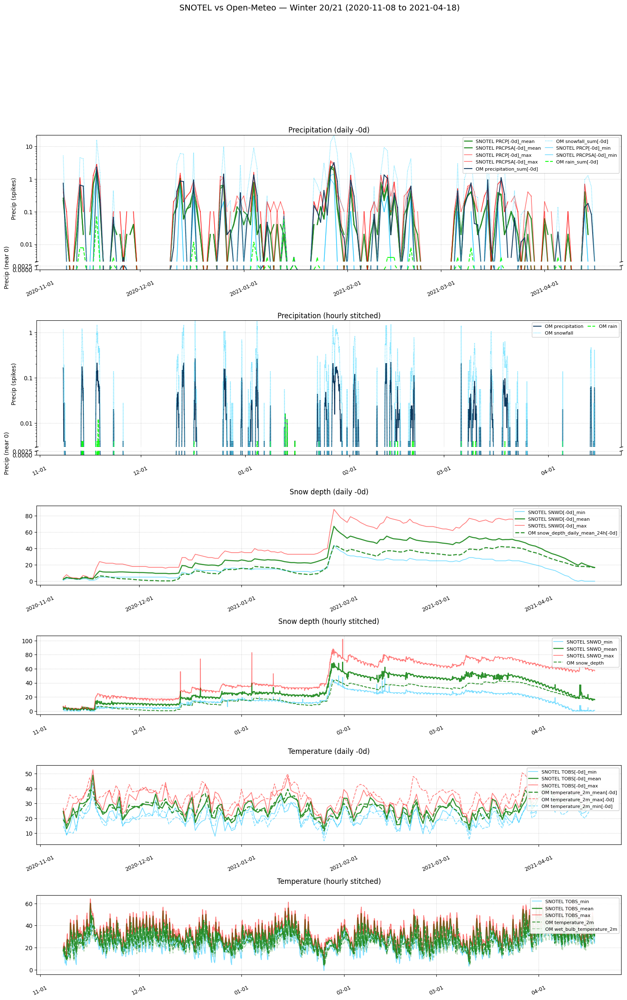

/var/folders/5g/ztyp6rl54tl1g18fgb56fvx80000gn/T/ipykernel_21868/1971618870.py:626: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0.06, 0.035, 0.94, 0.993], pad=0.35, h_pad=0.9, w_pad=0.7)


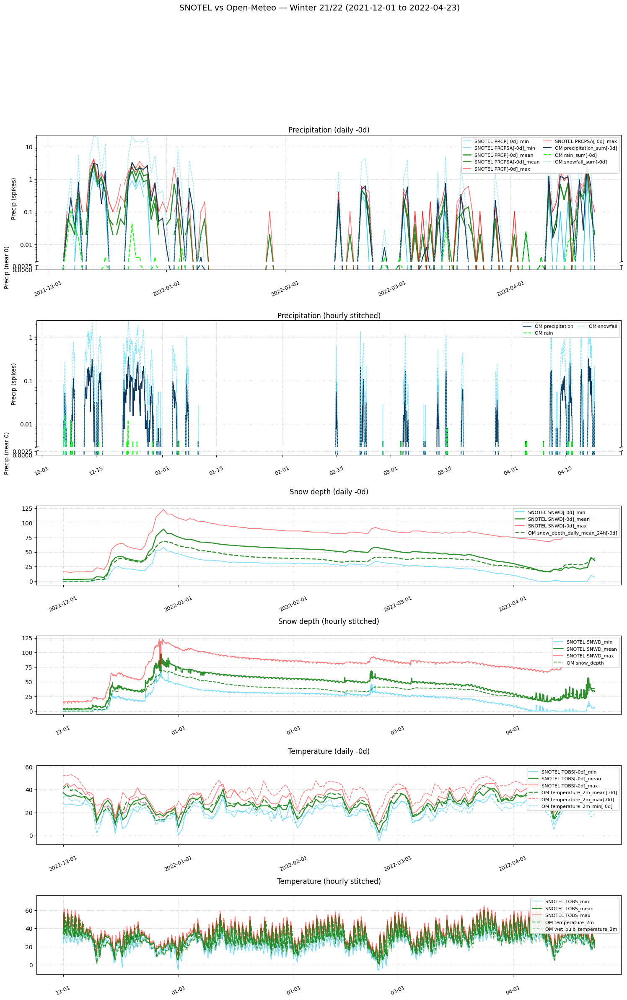

/var/folders/5g/ztyp6rl54tl1g18fgb56fvx80000gn/T/ipykernel_21868/1971618870.py:626: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0.06, 0.035, 0.94, 0.993], pad=0.35, h_pad=0.9, w_pad=0.7)


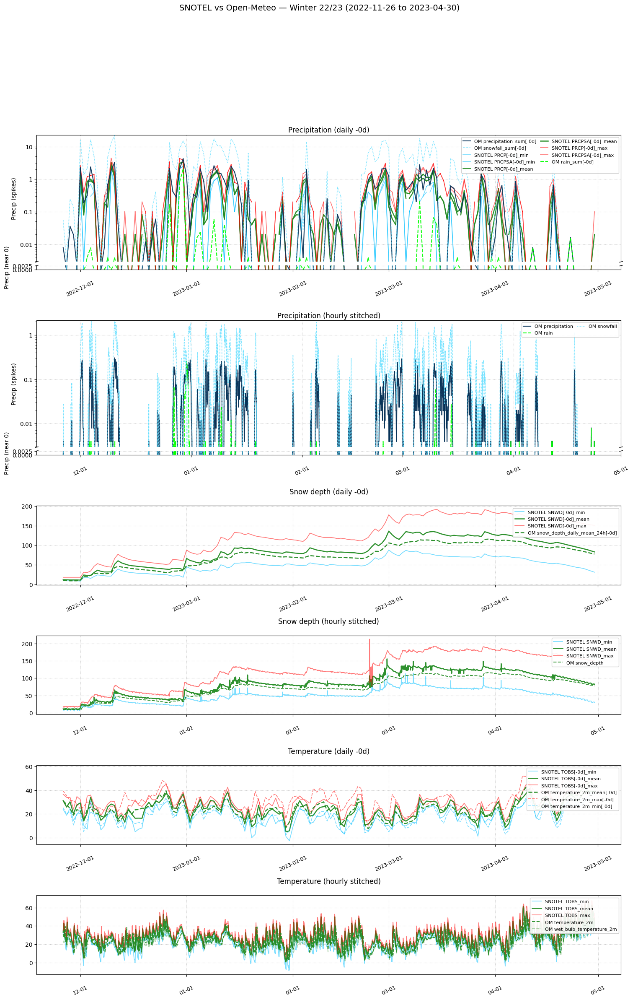

/var/folders/5g/ztyp6rl54tl1g18fgb56fvx80000gn/T/ipykernel_21868/1971618870.py:626: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0.06, 0.035, 0.94, 0.993], pad=0.35, h_pad=0.9, w_pad=0.7)


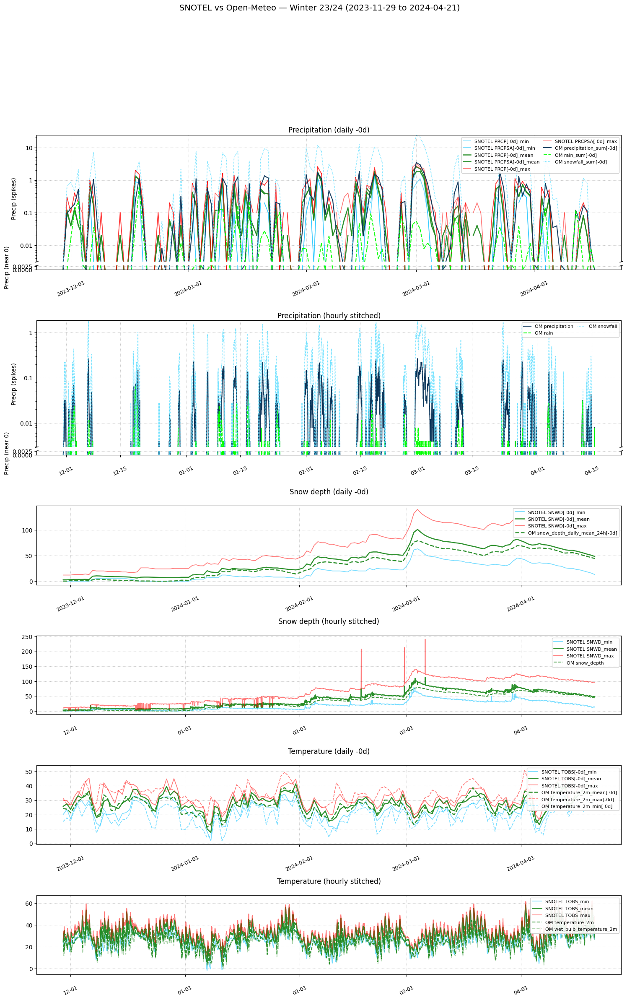

/var/folders/5g/ztyp6rl54tl1g18fgb56fvx80000gn/T/ipykernel_21868/1971618870.py:626: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0.06, 0.035, 0.94, 0.993], pad=0.35, h_pad=0.9, w_pad=0.7)


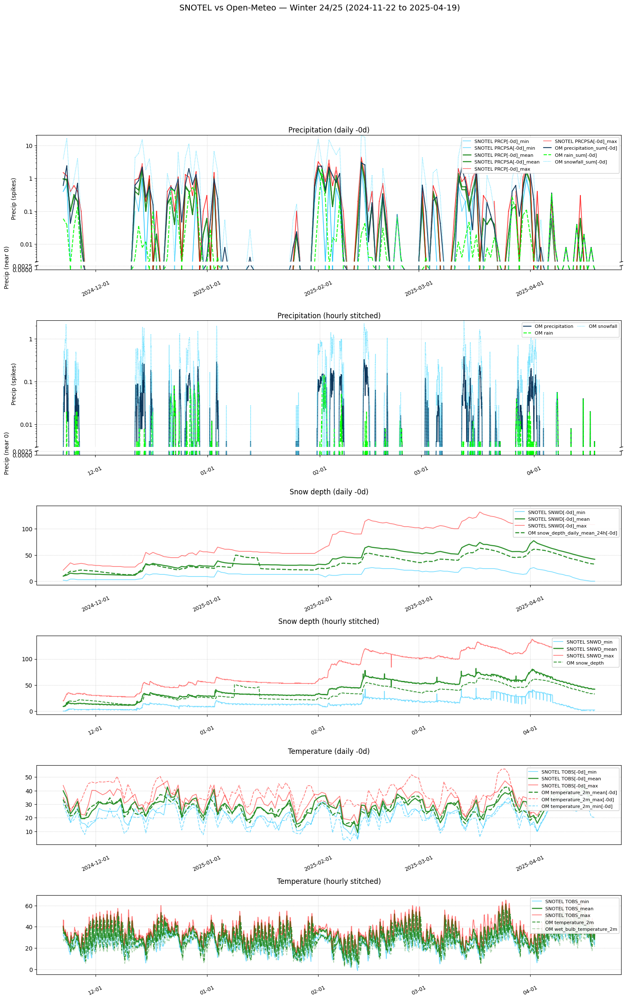

/var/folders/5g/ztyp6rl54tl1g18fgb56fvx80000gn/T/ipykernel_21868/1971618870.py:626: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0.06, 0.035, 0.94, 0.993], pad=0.35, h_pad=0.9, w_pad=0.7)


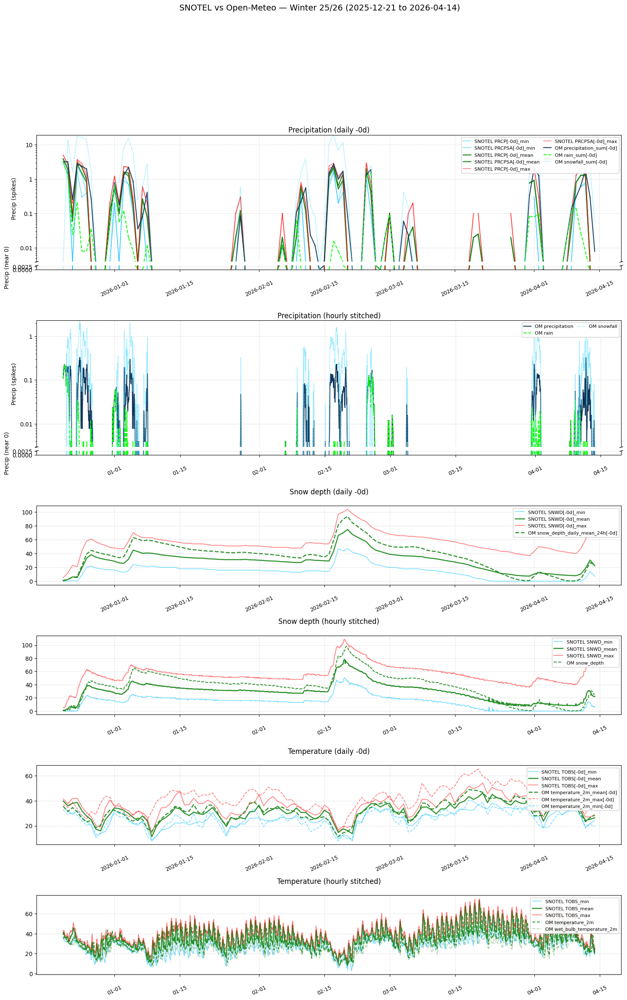

In [12]:
# Data comparison — SNOTEL vs Open-Meteo (23/24 winter)
# - Daily: compare only [-0d] columns of interest
# - Hourly: stitch [-Nh] windows into a continuous hourly series for the same season

from __future__ import annotations

from pathlib import Path

import matplotlib.dates as mdates
import matplotlib.ticker as mticker
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

_OFFLINE = Path("offline_data")

SNOTEL_PATH = _OFFLINE / "snotel_features.parquet"
OM_HOURLY_PATH = _OFFLINE / "open_meteo_hourly_windowed.parquet"
OM_DAILY_PATH = _OFFLINE / "open_meteo_daily_windowed.parquet"


def _to_dt(s: pd.Series) -> pd.Series:
    return pd.to_datetime(s, errors="coerce", utc=True).dt.tz_convert(None)


def _winter_start_year(dt: pd.Series) -> pd.Series:
    m = dt.dt.month
    y = dt.dt.year
    out = pd.Series(pd.NA, index=dt.index, dtype="Int64")
    out[m >= 11] = y[m >= 11]
    out[m <= 4] = y[m <= 4] - 1
    return out


def _forecast_date_col(df: pd.DataFrame) -> str:
    for c in ("forecast_date", "date"):
        if c in df.columns:
            return c
    raise ValueError(f"No forecast date col in FORECAST_DF: {list(df.columns)[:20]}")


def _rating_mask(df: pd.DataFrame) -> pd.Series:
    # Prefer common label columns; otherwise fall back to any non-null row.
    for c in ("danger_level", "danger", "rating", "overall_danger"):
        if c in df.columns:
            return df[c].notna()
    non_date_cols = [c for c in df.columns if c not in ("date", "forecast_date")]
    if not non_date_cols:
        return pd.Series(False, index=df.index)
    return df[non_date_cols].notna().any(axis=1)


def _rated_winter_bounds_by_year(
    forecast_df: pd.DataFrame,
) -> dict[int, tuple[pd.Timestamp, pd.Timestamp]]:
    """Per winter season (Nov–Apr logic via _winter_start_year): (min, max) forecast dates that have labels."""
    dc = _forecast_date_col(forecast_df)
    rated = _rating_mask(forecast_df)
    use = forecast_df.loc[rated].copy()
    use["_dt"] = _to_dt(use[dc]).dt.normalize()
    use["_winter"] = _winter_start_year(use["_dt"])
    use = use.dropna(subset=["_winter", "_dt"])  # type: ignore[arg-type]
    if use.empty:
        return {}
    bounds: dict[int, tuple[pd.Timestamp, pd.Timestamp]] = {}
    for wy, g in use.groupby("_winter"):
        bounds[int(wy)] = (pd.Timestamp(g["_dt"].min()), pd.Timestamp(g["_dt"].max()))
    return bounds


def _season_label(start_year: int) -> str:
    return f"{start_year % 100:02d}/{(start_year + 1) % 100:02d}"


def _overlapping_rated_winters(
    overlap_start: pd.Timestamp,
    overlap_end: pd.Timestamp,
    bounds_by_year: dict[int, tuple[pd.Timestamp, pd.Timestamp]],
) -> list[int]:
    """Winter seasons whose labeled date range intersects [overlap_start, overlap_end]."""
    overlap_start = pd.Timestamp(overlap_start).normalize()
    overlap_end = pd.Timestamp(overlap_end).normalize()
    starts: list[int] = []
    for y, (s, e) in bounds_by_year.items():
        s = pd.Timestamp(s).normalize()
        e = pd.Timestamp(e).normalize()
        if e < overlap_start or s > overlap_end:
            continue
        starts.append(int(y))
    return sorted(set(starts))


def _agg_daily_snotel(df: pd.DataFrame, date_col: str, cols: list[str]) -> pd.DataFrame:
    """Aggregate SNOTEL across stations with min/mean/max for each day."""
    out = df[[date_col, *cols]].copy()
    out[date_col] = _to_dt(out[date_col]).dt.normalize()
    out = out.dropna(subset=[date_col])
    if not cols:
        return pd.DataFrame(index=pd.DatetimeIndex([], name="date"))

    g = out.groupby(date_col)[cols]
    mins = g.min().add_suffix("_min")
    means = g.mean().add_suffix("_mean")
    maxs = g.max().add_suffix("_max")
    agg = pd.concat([mins, means, maxs], axis=1).sort_index()
    agg.index.name = "date"
    return agg


def _agg_daily_om(df: pd.DataFrame, date_col: str, cols: list[str]) -> pd.DataFrame:
    out = df[[date_col, *cols]].copy()
    out[date_col] = _to_dt(out[date_col]).dt.normalize()
    out = out.dropna(subset=[date_col])
    out = out.groupby(date_col)[cols].mean()
    out.index.name = "date"
    return out.sort_index()


def _stitch_hourly_window(
    df: pd.DataFrame,
    date_col: str,
    bases: list[str],
    *,
    min_lag_h: int = -91,
    max_lag_h: int = 0,
    snotel_minmax: bool = False,
) -> pd.DataFrame:
    t0 = _to_dt(df[date_col]).dt.floor("h")

    out: dict[str, pd.Series] = {}
    for base in bases:
        if (not snotel_minmax) and (base in df.columns):
            # Unwindowed hourly column (e.g. snow_depth_daily_mean_24h): value already aligned to forecast_time.
            s = pd.Series(df[base].to_numpy(), index=t0)
            s = s[~pd.isna(s.index)]
            out[base] = s.groupby(level=0).mean().sort_index()
            continue

        wcols = [f"{base}[{lag}h]" for lag in range(max_lag_h, min_lag_h - 1, -1) if f"{base}[{lag}h]" in df.columns]
        if not wcols:
            continue

        if snotel_minmax:
            # Collect all station/window contributions at each stitched timestamp,
            # then keep min/mean/max across stations.
            vals_by_ts: dict[pd.Timestamp, list[float]] = {}
            for i in range(len(df)):
                base_t = t0.iloc[i]
                if pd.isna(base_t):
                    continue
                row = df.iloc[i]
                for sc in wcols:
                    lag = int(sc.split("[")[-1].split("h]")[0])
                    ts = pd.Timestamp(base_t) + pd.Timedelta(hours=lag)
                    v = row.get(sc)
                    if pd.isna(v):
                        continue
                    vals_by_ts.setdefault(ts, []).append(float(v))
            if vals_by_ts:
                out[f"{base}_min"] = pd.Series({k: np.nanmin(v) for k, v in vals_by_ts.items()}).sort_index()
                out[f"{base}_mean"] = pd.Series({k: np.nanmean(v) for k, v in vals_by_ts.items()}).sort_index()
                out[f"{base}_max"] = pd.Series({k: np.nanmax(v) for k, v in vals_by_ts.items()}).sort_index()
        else:
            # For non-SNOTEL sources, keep first-filled to avoid overlap duplicates.
            order = np.argsort(t0.values)
            store: dict[pd.Timestamp, float] = {}
            for i in order:
                base_t = t0.iloc[int(i)]
                if pd.isna(base_t):
                    continue
                row = df.iloc[int(i)]
                for sc in wcols:
                    lag = int(sc.split("[")[-1].split("h]")[0])
                    ts = pd.Timestamp(base_t) + pd.Timedelta(hours=lag)
                    if ts in store:
                        continue
                    v = row.get(sc)
                    if pd.isna(v):
                        continue
                    store[ts] = float(v)
            if store:
                out[base] = pd.Series(store).sort_index()

    if not out:
        empty = pd.DataFrame()
        empty.index = pd.DatetimeIndex([], name="datetime")
        return empty

    stitched = pd.DataFrame(out).sort_index()
    stitched.index = pd.to_datetime(stitched.index)
    stitched.index.name = "datetime"
    return stitched


def _clip_dt_index(df: pd.DataFrame, start: pd.Timestamp, end: pd.Timestamp) -> pd.DataFrame:
    if df is None or df.empty:
        return df
    idx = pd.to_datetime(df.index, errors="coerce")
    keep = idx.notna() & (idx >= start) & (idx <= end)
    out = df.loc[keep].copy()
    out.index = idx[keep]
    return out


# ---------------- Load data ----------------
existing_snotel = pd.read_parquet(SNOTEL_PATH)
om_hourly = pd.read_parquet(OM_HOURLY_PATH)
om_daily = pd.read_parquet(OM_DAILY_PATH)

if "FORECAST_DF" in globals() and isinstance(FORECAST_DF, pd.DataFrame) and not FORECAST_DF.empty:
    forecast_df = FORECAST_DF.copy()
else:
    forecast_df = pd.read_parquet(_OFFLINE / "sample_data.parquet")

# Per-winter min/max labeled forecast dates (length varies by season)
rated_winter_bounds = _rated_winter_bounds_by_year(forecast_df)
if not rated_winter_bounds:
    print("Warning: no rated Nov–Apr forecast rows in forecast_df; overlapping winters will be empty.")

# date cols
DATE_COL_SNOTEL = "forecast_date" if "forecast_date" in existing_snotel.columns else "date"
DATE_COL_OM_H = "forecast_date" if "forecast_date" in om_hourly.columns else "date"
DATE_COL_OM_D = "forecast_date" if "forecast_date" in om_daily.columns else "date"

# ---------------- Build full-series daily and hourly views first ----------------
# Daily
snotel_precip_d_cols = ["PRCP[-0d]", "PRCPSA[-0d]"]
om_precip_d_cols = ["precipitation_sum[-0d]", "rain_sum[-0d]", "snowfall_sum[-0d]"]
snotel_snow_d_cols = ["SNWD[-0d]"]
om_snow_d_cols = ["snow_depth_daily_mean_24h[-0d]"]
a_snotel_temp_d_cols = ["TOBS[-0d]"]
om_temp_d_cols = ["temperature_2m_mean[-0d]", "temperature_2m_max[-0d]", "temperature_2m_min[-0d]"]

snotel_precip_d_full = _agg_daily_snotel(existing_snotel, DATE_COL_SNOTEL, [c for c in snotel_precip_d_cols if c in existing_snotel.columns])
om_precip_d_full = _agg_daily_om(om_daily, DATE_COL_OM_D, [c for c in om_precip_d_cols if c in om_daily.columns])
snotel_snow_d_full = _agg_daily_snotel(existing_snotel, DATE_COL_SNOTEL, [c for c in snotel_snow_d_cols if c in existing_snotel.columns])
om_snow_d_full = _agg_daily_om(om_daily, DATE_COL_OM_D, [c for c in om_snow_d_cols if c in om_daily.columns])
snotel_temp_d_full = _agg_daily_snotel(existing_snotel, DATE_COL_SNOTEL, [c for c in a_snotel_temp_d_cols if c in existing_snotel.columns])
om_temp_d_full = _agg_daily_om(om_daily, DATE_COL_OM_D, [c for c in om_temp_d_cols if c in om_daily.columns])

# Hourly
snotel_precip_h_full = _stitch_hourly_window(existing_snotel, DATE_COL_SNOTEL, ["PRCP", "PRCPSA"], min_lag_h=-91, max_lag_h=0, snotel_minmax=True)
om_precip_h_full = _stitch_hourly_window(om_hourly, DATE_COL_OM_H, ["precipitation", "rain", "snowfall"], min_lag_h=-91, max_lag_h=0)
snotel_snow_h_full = _stitch_hourly_window(existing_snotel, DATE_COL_SNOTEL, ["SNWD"], min_lag_h=-91, max_lag_h=0, snotel_minmax=True)
om_snow_h_full = _stitch_hourly_window(om_hourly, DATE_COL_OM_H, ["snow_depth"], min_lag_h=-91, max_lag_h=0)
snotel_temp_h_full = _stitch_hourly_window(existing_snotel, DATE_COL_SNOTEL, ["TOBS"], min_lag_h=-91, max_lag_h=0, snotel_minmax=True)
om_temp_h_full = _stitch_hourly_window(om_hourly, DATE_COL_OM_H, ["temperature_2m", "wet_bulb_temperature_2m"], min_lag_h=-91, max_lag_h=0)

# Determine winter seasons that overlap for BOTH daily precip series.
if snotel_precip_d_full.empty or om_precip_d_full.empty:
    raise RuntimeError("No daily precip data available to compute overlapping seasons.")

overlap_start = max(pd.Timestamp(snotel_precip_d_full.index.min()), pd.Timestamp(om_precip_d_full.index.min()))
overlap_end = min(pd.Timestamp(snotel_precip_d_full.index.max()), pd.Timestamp(om_precip_d_full.index.max()))
if overlap_start > overlap_end:
    raise RuntimeError("No overlapping date range between SNOTEL and Open-Meteo daily precip series.")

winter_starts = _overlapping_rated_winters(overlap_start, overlap_end, rated_winter_bounds)
print(f"Overlapping winters: {', '.join(_season_label(y) for y in winter_starts)}")

# ---------------- Plot ----------------
_EDGE_ALPHA = 0.52


def _style_for_col(col: str) -> dict:
    """Green=mean/primary, light blue=min, red=max; works for PRCP[-0d]_mean and metric[-0d]."""
    s = str(col)
    lc = s.lower()

    if "wet_bulb_temperature_2m" in lc:
        return {"color": "#228B22", "alpha": 0.35, "linewidth": 1.4}

    if "snow_depth_daily_mean_24h" in lc:
        return {"color": "#228B22", "alpha": 0.95, "linewidth": 1.8}

    # Station aggregate suffix after window tag: PRCP[-0d]_mean
    if lc.endswith("_mean"):
        return {"color": "#228B22", "alpha": 0.95, "linewidth": 1.8}
    if lc.endswith("_min"):
        return {"color": "#00BFFF", "alpha": _EDGE_ALPHA, "linewidth": 1.25}
    if lc.endswith("_max"):
        return {"color": "#FF0000", "alpha": _EDGE_ALPHA, "linewidth": 1.25}

    # Windowed columns: stem is before first '[' e.g. temperature_2m_mean[-0d]
    stem = lc.split("[", 1)[0] if "[" in lc else lc
    if stem.endswith("_mean") or "daily_mean" in stem:
        return {"color": "#228B22", "alpha": 0.95, "linewidth": 1.8}
    if stem.endswith("_min"):
        return {"color": "#00BFFF", "alpha": _EDGE_ALPHA, "linewidth": 1.25}
    if stem.endswith("_max"):
        return {"color": "#FF0000", "alpha": _EDGE_ALPHA, "linewidth": 1.25}

    # Primary OM / stitched hourly bases (precipitation, rain, snow_depth, etc.)
    return {"color": "#228B22", "alpha": 0.9, "linewidth": 1.45}


def _plot_df(ax, df, label_prefix: str, linestyle: str = "-"):
    is_log = ax.get_yscale() == "log"
    for c in df.columns:
        st = _style_for_col(c)
        y_raw = df[c].where(np.isfinite(df[c]))
        y = y_raw
        if is_log:
            y = y.where(y > 0)
        ax.plot(
            df.index,
            y,
            linestyle=linestyle,
            color=st["color"],
            alpha=st["alpha"],
            linewidth=st["linewidth"],
            label=f"{label_prefix} {c}",
        )


OM_PRECIP_BLUE = "#083358"
OM_RAIN_GREEN = "#00FF00"
OM_SNOW_LIGHT_BLUE = "#66E0FF"


def _precip_cross_t(t0, t1, y0, y1, y_cross: float):
    """Time where the segment (t0,y0)→(t1,y1) crosses y_cross (linear interpolation)."""
    if y1 == y0:
        return t0
    w = (y_cross - y0) / (y1 - y0)
    return t0 + w * (t1 - t0)


def _precip_plot_lo_hi_split(ax_lo, ax_hi, df, label_prefix: str, linestyle: str, om: bool) -> None:
    """Plot continuous precip lines: each segment is split at y=break_y onto lo (linear) or hi (log)."""
    if df is None or df.empty:
        return
    break_y = getattr(ax_lo, "_precip_break_y", None)
    if break_y is None or not ax_hi.get_visible():
        return
    for c in df.columns:
        y_raw = df[c].where(np.isfinite(df[c]))
        if om:
            lc = str(c).lower()
            if "snowfall" in lc or (lc.startswith("snow") and "snow_depth" not in lc and "rain" not in lc):
                ls, col, lw, al = (0, (1, 1)), OM_SNOW_LIGHT_BLUE, 1.25, 0.85
            elif "rain" in lc:
                ls, col, lw, al = "--", OM_RAIN_GREEN, 1.55, 0.92
            else:
                ls, col, lw, al = "-", OM_PRECIP_BLUE, 1.55, 0.92
        else:
            st = _style_for_col(c)
            ls, col, lw, al = linestyle, st["color"], st["linewidth"], st["alpha"]
        lab = f"{label_prefix} {c}"
        kw = dict(linestyle=ls, color=col, alpha=al, linewidth=lw)
        t_idx = df.index
        n = len(t_idx)
        label_remain = [True]

        def _kw():
            if label_remain[0]:
                label_remain[0] = False
                return {**kw, "label": lab}
            return kw.copy()

        for i in range(n - 1):
            t0, t1 = t_idx[i], t_idx[i + 1]
            y0, y1 = float(y_raw.iloc[i]), float(y_raw.iloc[i + 1])
            if not (np.isfinite(y0) and np.isfinite(y1)):
                continue
            if y0 == y1:
                continue
            if y0 <= break_y and y1 <= break_y:
                ax_lo.plot([t0, t1], [y0, y1], **_kw())
            elif y0 > break_y and y1 > break_y:
                ax_hi.plot([t0, t1], [y0, y1], **_kw())
            elif y0 <= break_y and y1 > break_y:
                t_star = _precip_cross_t(t0, t1, y0, y1, break_y)
                if t_star != t0:
                    ax_lo.plot([t0, t_star], [y0, break_y], **_kw())
                    ax_hi.plot([t_star, t1], [break_y, y1], **kw.copy())
                else:
                    ax_hi.plot([t_star, t1], [break_y, y1], **_kw())
            else:
                t_star = _precip_cross_t(t0, t1, y0, y1, break_y)
                if t_star != t1:
                    ax_hi.plot([t0, t_star], [y0, break_y], **_kw())
                    ax_lo.plot([t_star, t1], [break_y, y1], **kw.copy())
                else:
                    ax_lo.plot([t_star, t1], [break_y, y1], **_kw())


def _precip_y_values(*dfs) -> np.ndarray:
    parts: list[np.ndarray] = []
    for df in dfs:
        if df is None or df.empty:
            continue
        num = df.select_dtypes(include=[np.number])
        if num.empty:
            continue
        a = num.to_numpy().ravel()
        a = a[np.isfinite(a)]
        if len(a):
            parts.append(a)
    if not parts:
        return np.array([])
    return np.concatenate(parts)


def _format_log_y_plain(value: float, _pos: int | None) -> str:
    """Log-axis ticks: no scientific notation; decades as compact decimals; other ticks as positional floats."""
    if not np.isfinite(value) or value <= 0:
        return ""
    exp = np.log10(value)
    r = round(exp)
    if np.isclose(exp, r, rtol=0.0, atol=1e-12):
        ri = int(r)
        if ri == 0:
            return "1"
        if ri > 0:
            return str(10**ri)
        return "0." + "0" * (-ri - 1) + "1"
    return np.format_float_positional(float(value), precision=6, unique=True, trim="-")


def _slash_break(ax_hi, ax_lo) -> None:
    """Broken-axis marks following Matplotlib gallery style."""
    ax_hi.spines["bottom"].set_visible(False)
    ax_lo.spines["top"].set_visible(False)
    ax_hi.tick_params(axis="x", which="both", bottom=False, labelbottom=False)
    ax_lo.xaxis.tick_bottom()

    d = 0.25
    kwargs = dict(
        marker=[(-1, -d), (1, d)],
        markersize=6,
        linestyle="none",
        color="k",
        mec="k",
        mew=1,
        clip_on=False,
    )
    ax_hi.plot([0, 1], [0, 0], transform=ax_hi.transAxes, **kwargs)
    ax_lo.plot([0, 1], [1, 1], transform=ax_lo.transAxes, **kwargs)


def _precip_broken_ylim(ax_hi, ax_lo, *dfs) -> None:
    """Broken precip y: upper = log spikes, lower = linear near-0 (so 0 values are visible)."""
    v = _precip_y_values(*dfs)
    v = v[np.isfinite(v)]
    if len(v) == 0:
        return

    for a in (ax_hi, ax_lo):
        a._precip_break_y = None

    pos = v[v > 0]
    if len(pos) == 0:
        # Everything is 0 -> only show a linear axis.
        ax_hi.set_visible(False)
        ax_lo.set_yscale("linear")
        ax_lo.set_frame_on(True)
        ax_lo.set_ylim(0, 1.0)
        ax_lo.set_ylabel("Precip")
        return

    ymin = float(np.nanmin(pos))
    ymax = float(np.nanmax(pos))

    # Pick a break strictly below the global minimum positive precip (`ymin`) so that
    # the minimum positive value is always plotted on the upper (log) axis.
    p1 = float(np.nanpercentile(pos, 1))
    p2 = float(np.nanpercentile(pos, 2))

    # Tighter linear (0..lo_max) band hugging zero — smaller ceiling than the old p2-heavy mix.
    lo_max_candidate = max(p1 * 0.68, p2 * 0.74)
    eps = 1e-10
    lo_max = min(lo_max_candidate, ymin * (1.0 - eps))
    if lo_max <= 0:
        lo_max = max(ymin * 0.9, 1e-10)

    if ymax <= lo_max * 1.05:
        # No meaningful break; just show one linear axis.
        ax_hi.set_visible(False)
        ax_lo.set_yscale("linear")
        ax_lo.set_frame_on(True)
        ax_lo.set_ylim(0, ymax * 1.05)
        ax_lo.set_ylabel("Precip")
        return

    ax_hi._precip_break_y = lo_max
    ax_lo._precip_break_y = lo_max

    ax_hi.set_yscale("log")
    ax_lo.set_yscale("linear")
    ax_hi.yaxis.set_major_locator(mticker.LogLocator(base=10))
    ax_hi.yaxis.set_major_formatter(mticker.FuncFormatter(_format_log_y_plain))
    ax_hi.yaxis.set_minor_formatter(mticker.NullFormatter())

    # Tighten the upper padding so spikes use more of the axis height.
    ax_hi.set_ylim(lo_max, ymax * 1.02)
    ax_lo.set_ylim(0, lo_max)

    ax_hi.set_ylabel("Precip (spikes)")
    ax_lo.set_ylabel("Precip (near 0)")

    _slash_break(ax_hi, ax_lo)


def _major_grid(ax) -> None:
    ax.set_axisbelow(True)
    ax.grid(True, which="major", axis="both", linestyle=":", linewidth=0.8, alpha=0.75)


def _legend_dedupe(ax_primary, *ax_extra, **legend_kw):
    h, lab = ax_primary.get_legend_handles_labels()
    for axo in ax_extra:
        h2, l2 = axo.get_legend_handles_labels()
        h, lab = list(h) + list(h2), list(lab) + list(l2)
    seen = {}
    for handle, label in zip(h, lab):
        seen[label] = handle
    kw = dict(fontsize=8, loc="upper right", framealpha=0.92, ncol=2, columnspacing=0.9, handlelength=1.6)
    kw.update(legend_kw)
    clip_on = kw.pop("clip_on", None)
    leg = ax_primary.legend(seen.values(), seen.keys(), **kw)
    if clip_on is not None:
        leg.set_clip_on(bool(clip_on))



for winter_start in winter_starts:
    season_start, season_end = rated_winter_bounds[winter_start]

    # Seasonal clips (daily)
    snotel_precip_d = snotel_precip_d_full.loc[(snotel_precip_d_full.index >= season_start) & (snotel_precip_d_full.index <= season_end)]
    om_precip_d = om_precip_d_full.loc[(om_precip_d_full.index >= season_start) & (om_precip_d_full.index <= season_end)]
    snotel_snow_d = snotel_snow_d_full.loc[(snotel_snow_d_full.index >= season_start) & (snotel_snow_d_full.index <= season_end)]
    om_snow_d = om_snow_d_full.loc[(om_snow_d_full.index >= season_start) & (om_snow_d_full.index <= season_end)]
    snotel_temp_d = snotel_temp_d_full.loc[(snotel_temp_d_full.index >= season_start) & (snotel_temp_d_full.index <= season_end)]
    om_temp_d = om_temp_d_full.loc[(om_temp_d_full.index >= season_start) & (om_temp_d_full.index <= season_end)]

    # Seasonal clips (hourly)
    season_end_h = season_end + pd.Timedelta(days=1)
    snotel_precip_h = _clip_dt_index(snotel_precip_h_full, season_start, season_end_h)
    om_precip_h = _clip_dt_index(om_precip_h_full, season_start, season_end_h)
    snotel_snow_h = _clip_dt_index(snotel_snow_h_full, season_start, season_end_h)
    om_snow_h = _clip_dt_index(om_snow_h_full, season_start, season_end_h)
    snotel_temp_h = _clip_dt_index(snotel_temp_h_full, season_start, season_end_h)
    om_temp_h = _clip_dt_index(om_temp_h_full, season_start, season_end_h)

    if snotel_precip_d.empty and om_precip_d.empty:
        continue

    # ---------------- Plot layout (precip uses broken y; others single axis) ----------------
    fig = plt.figure(figsize=(18, 26))
    outer = fig.add_gridspec(
        6,
        1,
        height_ratios=[2.3, 2.3, 1.35, 1.35, 1.35, 1.35],
        hspace=0.52,
    )
    gs_pd = outer[0].subgridspec(2, 1, height_ratios=[6.0, 0.20], hspace=0.055)
    gs_ph = outer[1].subgridspec(2, 1, height_ratios=[6.0, 0.20], hspace=0.055)

    ax_pd_hi = fig.add_subplot(gs_pd[0, 0])
    ax_pd_lo = fig.add_subplot(gs_pd[1, 0], sharex=ax_pd_hi)
    ax_ph_hi = fig.add_subplot(gs_ph[0, 0])
    ax_ph_lo = fig.add_subplot(gs_ph[1, 0], sharex=ax_ph_hi)
    axes_sd = fig.add_subplot(outer[2, 0])
    axes_sh = fig.add_subplot(outer[3, 0])
    axes_td = fig.add_subplot(outer[4, 0])
    axes_th = fig.add_subplot(outer[5, 0])

    # 1) Precip daily (broken y)
    _precip_broken_ylim(ax_pd_hi, ax_pd_lo, snotel_precip_d, om_precip_d)
    _precip_plot_lo_hi_split(ax_pd_lo, ax_pd_hi, snotel_precip_d, "SNOTEL", "-", om=False)
    _precip_plot_lo_hi_split(ax_pd_lo, ax_pd_hi, om_precip_d, "OM", "-", om=True)
    ax_pd_hi.set_title("Precipitation (daily -0d)", pad=4)
    _legend_dedupe(ax_pd_hi, ax_pd_lo)
    for _ax in (ax_pd_hi, ax_pd_lo):
        _ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m-%d"))
        _ax.tick_params(axis="x", rotation=25, labelsize=9, pad=14)

    # 2) Precip hourly
    _precip_broken_ylim(ax_ph_hi, ax_ph_lo, snotel_precip_h, om_precip_h)
    _precip_plot_lo_hi_split(ax_ph_lo, ax_ph_hi, snotel_precip_h, "SNOTEL", "-", om=False)
    _precip_plot_lo_hi_split(ax_ph_lo, ax_ph_hi, om_precip_h, "OM", "-", om=True)
    ax_ph_hi.set_title("Precipitation (hourly stitched)", pad=4)
    _legend_dedupe(ax_ph_hi, ax_ph_lo)
    for _ax in (ax_ph_hi, ax_ph_lo):
        _ax.xaxis.set_major_formatter(mdates.DateFormatter("%m-%d"))
        _ax.tick_params(axis="x", rotation=25, labelsize=9, pad=14)

    # 3) Snow depth daily
    ax = axes_sd
    _plot_df(ax, snotel_snow_d, "SNOTEL", "-")
    _plot_df(ax, om_snow_d, "OM", "--")
    ax.set_title("Snow depth (daily -0d)", pad=20)
    ax.legend(fontsize=8, loc="upper right", framealpha=0.92)
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m-%d"))
    ax.tick_params(axis="x", rotation=25, labelsize=9, pad=14)

    # 4) Snow depth hourly
    ax = axes_sh
    _plot_df(ax, snotel_snow_h, "SNOTEL", "-")
    _plot_df(ax, om_snow_h, "OM", "--")
    ax.set_title("Snow depth (hourly stitched)", pad=20)
    ax.legend(fontsize=8, loc="upper right", framealpha=0.92)
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%m-%d"))
    ax.tick_params(axis="x", rotation=25, labelsize=9, pad=14)

    # 5) Temp daily
    ax = axes_td
    _plot_df(ax, snotel_temp_d, "SNOTEL", "-")
    _plot_df(ax, om_temp_d, "OM", "--")
    ax.set_title("Temperature (daily -0d)", pad=20)
    ax.legend(fontsize=8, loc="upper right", framealpha=0.92)
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m-%d"))
    ax.tick_params(axis="x", rotation=25, labelsize=9, pad=14)

    # 6) Temp hourly
    ax = axes_th
    _plot_df(ax, snotel_temp_h, "SNOTEL", "-")
    _plot_df(ax, om_temp_h, "OM", "--")
    ax.set_title("Temperature (hourly stitched)", pad=20)
    ax.legend(fontsize=8, loc="upper right", framealpha=0.92)
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%m-%d"))
    ax.tick_params(axis="x", rotation=25, labelsize=9, pad=14)

    fig.tight_layout(rect=[0.06, 0.035, 0.94, 0.993], pad=0.35, h_pad=0.9, w_pad=0.7)
    for _gx in (ax_pd_hi, ax_pd_lo, ax_ph_hi, ax_ph_lo, axes_sd, axes_sh, axes_td, axes_th):
        _major_grid(_gx)
    fig.text(
        0.5,
        1.0,
        f"SNOTEL vs Open-Meteo — Winter {_season_label(winter_start)} ({season_start.date()} to {season_end.date()})",
        ha="center",
        va="top",
        fontsize=14,
        transform=fig.transFigure,
    )
    plt.show()


## Early season datapoints
It seems like there are sparse datapoints at the beginning of every season. Let's take a look at this here

In [13]:
print(forecast_df.sort_values(by="date").groupby("season").head(3))

df = snotel_features.copy()
cols = ["stationTriplet", "forecast_date", "WTEQ[-0d]"]
df = df[df["stationTriplet"] == "428:CA:SNTL"].copy()
df["forecast_date"] = pd.to_datetime(df["forecast_date"])
df = df.sort_values("forecast_date").reset_index(drop=True)

# Find where the gap between dates is >60 days
gap_idx = df["forecast_date"].diff().dt.days.gt(60)

# For each such index, get the next 3 days (including the gap day)
selected_indices = []
gap_locs = gap_idx[gap_idx].index.tolist()
for loc in gap_locs:
    next_three = list(range(loc, min(loc+3, len(df))))
    selected_indices.extend(next_three)

selected_indices = sorted(set(selected_indices))
result = df.loc[selected_indices, cols].sort_values("forecast_date")
print(result)

           date  ATL  NTL  BTL  Max season
1759 2014-09-26    0    0    0    0  14/15
1758 2014-10-31    0    0    0    0  14/15
1757 2014-11-13    0    0    0    0  14/15
1637 2015-09-15    0    0    0    0  15/16
1636 2015-10-31    0    0    0    0  15/16
1635 2015-11-09    0    0    0    0  15/16
1478 2016-10-03    0    0    0    0  16/17
1477 2016-10-15    0    0    0    0  16/17
1476 2016-11-03    0    0    0    0  16/17
1322 2017-09-22    0    0    0    0  17/18
1321 2017-10-18    0    0    0    0  17/18
1320 2017-11-03    0    0    0    0  17/18
1169 2018-10-08    0    0    0    0  18/19
1168 2018-11-07    0    0    0    0  18/19
1167 2018-11-21    0    0    0    0  18/19
1021 2019-09-30    0    0    0    0  19/20
1020 2019-11-05    0    0    0    0  19/20
1019 2019-11-20    0    0    0    0  19/20
860  2020-10-27    0    0    0    0  20/21
859  2020-11-08    0    0    0    0  20/21
858  2020-11-14    0    0    0    0  20/21
708  2021-12-01    1    1    1    1  21/22
707  2021-1

Conclusion: The Avalanche.org API doesn't always provide the advisory pages for the first several days of each season. This can be remedied at some point. I've fixed the feature data from OM and SNOTEL so that we get dense data despite sparse data from Avalanche.org. Let's  move on for now.

# Outlier investigation

Per-station **SNWD** from `snotel_features.parquet`: one figure per winter season, per station (**five lines**, top stations by row count). Uses `_stitch_hourly_window` with **`snotel_minmax=False`** so we get each stations' **SNWD** data, and **do not** pool stations into min/mean/max.


Using station column 'stationTriplet'; plotting 5 station(s): ['428:CA:SNTL', '539:CA:SNTL', '540:CA:SNTL', '541:CA:SNTL', '834:CA:SNTL']
Winter figures: 14/15, 15/16, 16/17, 17/18, 18/19, 19/20, 20/21, 21/22, 22/23, 23/24, 24/25, 25/26


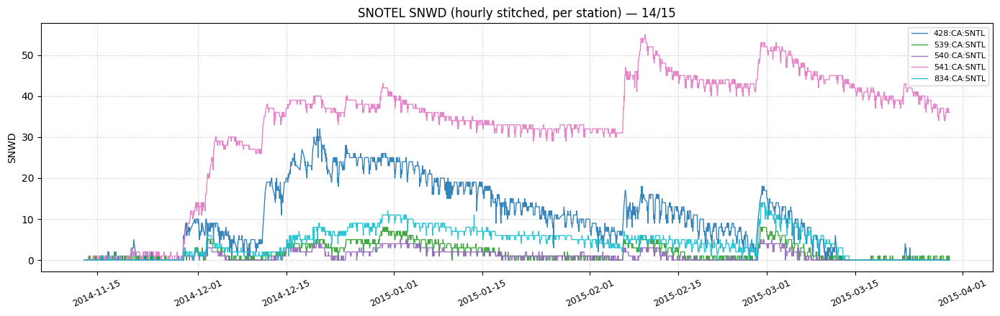

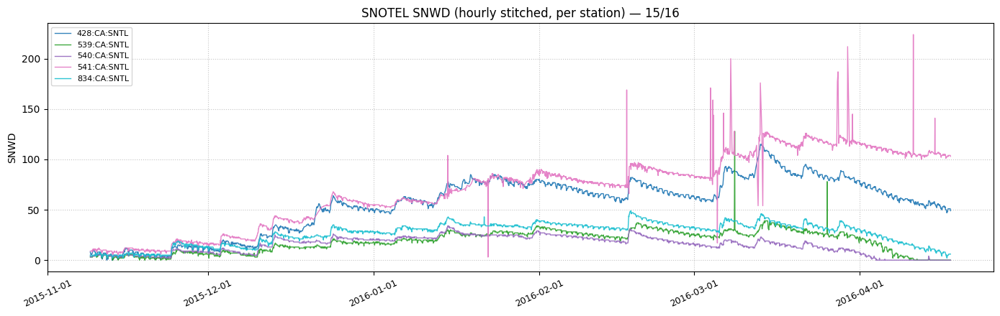

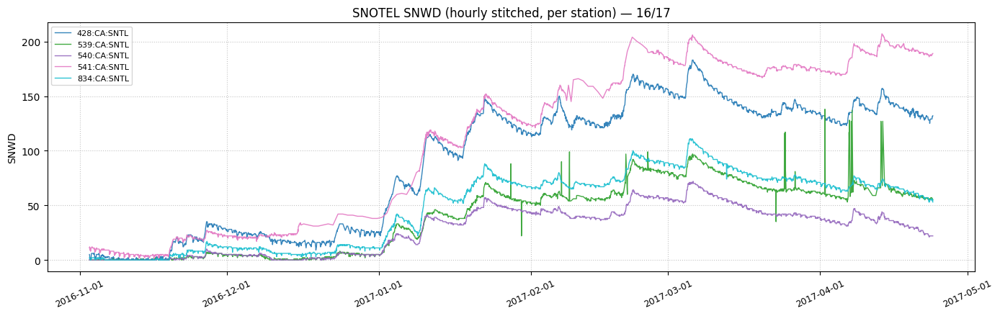

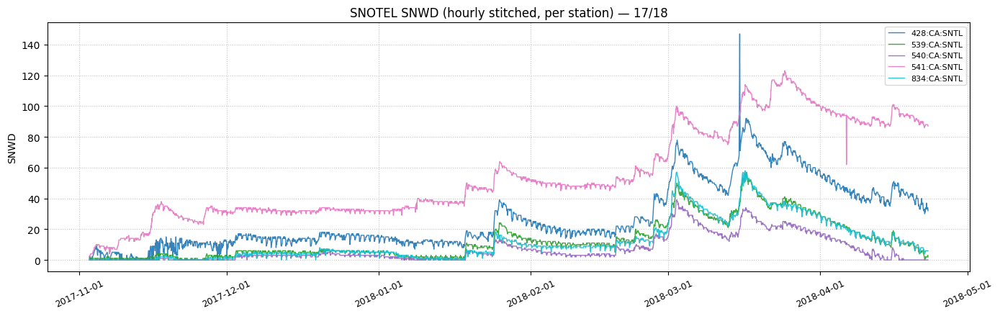

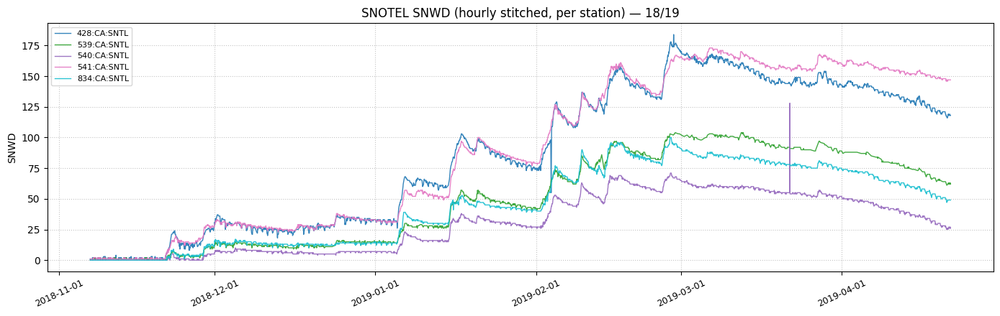

...

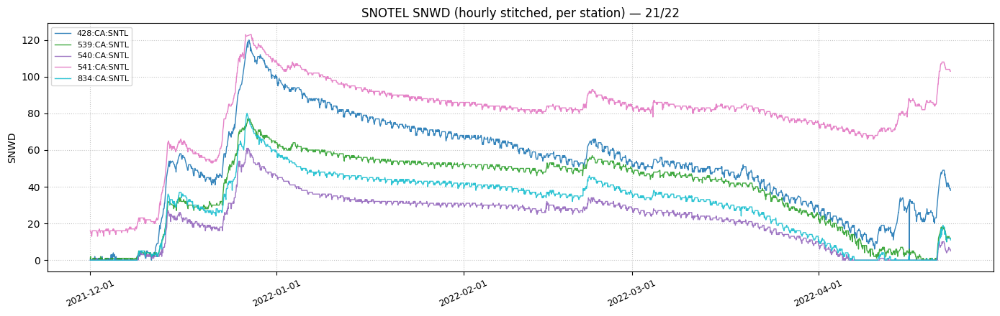

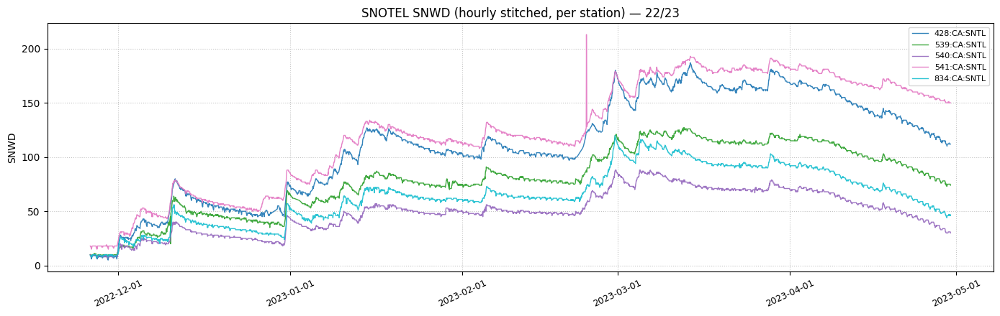

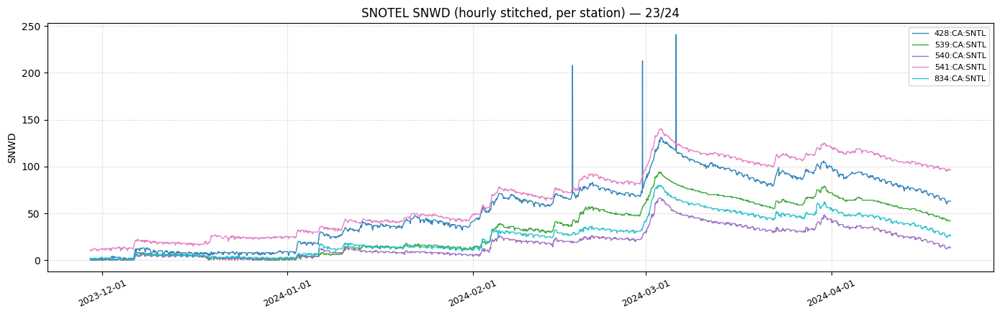

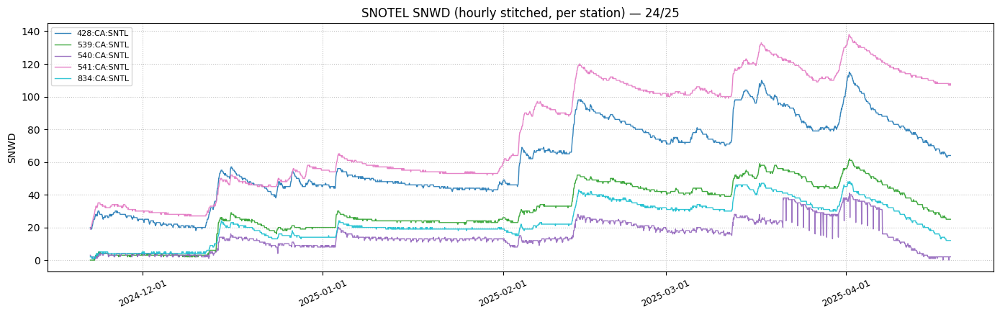

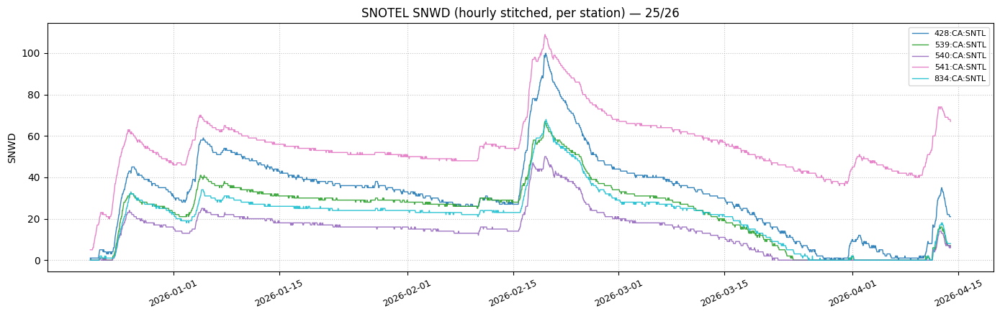

In [14]:
# Per-station SNWD (hourly stitched, no cross-station min/mean/max)
#
# Reuses: _to_dt, _rated_winter_bounds_by_year, _season_label,
#         _overlapping_rated_winters, _stitch_hourly_window, _clip_dt_index, SNOTEL_PATH
# Does NOT use snotel_minmax=True (avoids pooling stations into SNWD_min/mean/max).

import numpy as np
import pandas as pd
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
from pathlib import Path as _Path

# --- load SNOTEL ---
if "existing_snotel" in globals() and isinstance(existing_snotel, pd.DataFrame) and not existing_snotel.empty:
    snotel = existing_snotel.copy()
else:
    _sp = SNOTEL_PATH if "SNOTEL_PATH" in globals() else _Path("offline_data") / "snotel_features.parquet"
    snotel = pd.read_parquet(_sp)

_date_col = "forecast_date" if "forecast_date" in snotel.columns else "date"

# --- forecast window for winter bounds ---
if "forecast_df" in globals() and isinstance(forecast_df, pd.DataFrame) and not forecast_df.empty:
    _fdc = forecast_df
else:
    _off = _OFFLINE if "_OFFLINE" in globals() else _Path("offline_data")
    _fdc = pd.read_parquet(_off / "sample_data.parquet")

rated_winter_bounds = _rated_winter_bounds_by_year(_fdc)
if not rated_winter_bounds:
    print("Warning: no rated Nov–Apr forecast rows; winter figures will be skipped.")

# --- station column (pick one with a small finite set of IDs, prefer exactly ~5) ---
_cands = [
    c
    for c in snotel.columns
    if str(c).lower() in ("station_id", "station", "station_triplet", "stn", "site_id", "snotel_id", "triplet")
    or "station" in str(c).lower()
    or str(c).lower().endswith("_station")
]
stn_col = None
for c in _cands:
    n = snotel[c].nunique(dropna=True)
    if 2 <= n <= 30:
        stn_col = c
        break
if stn_col is None:
    for c in snotel.columns:
        if snotel[c].dtype == object or str(snotel[c].dtype).startswith("Int") or str(snotel[c].dtype).startswith("string"):
            n = snotel[c].nunique(dropna=True)
            if 3 <= n <= 15:
                stn_col = c
                break

if stn_col is None:
    raise RuntimeError(
        "Could not infer a station column. Columns sample: "
        + ", ".join(str(x) for x in list(snotel.columns)[:25])
    )

ranked = snotel[stn_col].value_counts(dropna=True)
station_ids = list(ranked.index[:5])
print(f"Using station column {stn_col!r}; plotting {len(station_ids)} station(s): {station_ids}")

# --- winter seasons spanned by this file ---
ov_s = pd.Timestamp(_to_dt(snotel[_date_col]).min()).normalize()
ov_e = pd.Timestamp(_to_dt(snotel[_date_col]).max()).normalize()
winter_starts = _overlapping_rated_winters(ov_s, ov_e, rated_winter_bounds)
print(f"Winter figures: {', '.join(_season_label(y) for y in winter_starts)}")

_colors = plt.cm.tab10(np.linspace(0, 0.9, max(5, len(station_ids))))

for wy in winter_starts:
    season_start, season_end = rated_winter_bounds[wy]
    season_end_h = season_end + pd.Timedelta(days=1)

    fig, ax = plt.subplots(figsize=(14, 4.5))
    for j, sid in enumerate(station_ids):
        sub = snotel[snotel[stn_col] == sid].copy()
        if sub.empty:
            continue
        # Per-station stitch: no cross-station aggregate (snotel_minmax=False).
        stitched = _stitch_hourly_window(sub, _date_col, ["SNWD"], min_lag_h=-91, max_lag_h=0, snotel_minmax=False)
        if stitched is None or stitched.empty or "SNWD" not in stitched.columns:
            continue
        h = _clip_dt_index(stitched[["SNWD"]], season_start, season_end_h)
        if h.empty:
            continue
        ax.plot(
            h.index,
            h["SNWD"],
            color=_colors[j % len(_colors)],
            linewidth=1.0,
            alpha=0.9,
            label=f"{sid}",
        )

    ax.set_title(f"SNOTEL SNWD (hourly stitched, per station) — {_season_label(wy)}")
    ax.set_ylabel("SNWD")
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m-%d"))
    ax.tick_params(axis="x", rotation=25, labelsize=9)
    ax.grid(True, which="major", axis="both", linestyle=":", linewidth=0.8, alpha=0.75)
    ax.legend(loc="best", fontsize=8)
    fig.tight_layout()
    plt.show()



Conclusion: The hourly **SNWD** data is not very consistent over time nor between stations from looking at these plots and the per season **SNWD** plots in the cell above. Over the course of all seasons, each station has it's own incorrect behavior. We'll rely on the daily **SNWD** data from the `snotel_features.parquet` file, and precipitation data for the short lookback hourly input.

In [15]:
# Perform covariance and correlation analysis on the daily and hourly data

In [ ]:
# Baseline: previous-day ratings → today, plus 10-day naive persistence.
# Max is always derived from ATL/NTL/BTL (never shifted independently).

BANDS = ("ATL", "NTL", "BTL")
VALID_SEASONS = ("24/25", "25/26")
N_LEADS = 10


def derive_max_from_bands(atl, ntl, btl):
    """Elementwise max across elevation bands (Series or DataFrame columns)."""
    return pd.concat([atl, ntl, btl], axis=1).max(axis=1)


def add_prev_day_predictions(
    df: pd.DataFrame,
    value_cols: tuple[str, ...] = BANDS,
) -> pd.DataFrame:
    """Left-join prior calendar-day values as ``pred_*`` columns."""
    out = df.copy()
    out["date"] = pd.to_datetime(out["date"], errors="coerce").dt.normalize()
    out = out.dropna(subset=["date"]).sort_values("date")
    prev = out[["date", *value_cols]].copy()
    prev["date"] = prev["date"] + pd.Timedelta(days=1)
    prev = prev.rename(columns={c: f"pred_{c}" for c in value_cols})
    return out.merge(prev, on="date", how="left")


def score_danger_predictions(y_true: pd.DataFrame, y_pred: pd.DataFrame) -> dict:
    """Accuracy / MAE / off-by-one for ATL, NTL, BTL, and derived Max."""
    out = {}
    for col in (*BANDS, "Max"):
        yt = y_true[col]
        yp = y_pred[col]
        mask = yt.notna() & yp.notna()
        yt, yp = yt[mask].astype(float), yp[mask].astype(float)
        n = int(len(yt))
        if n == 0:
            out[col] = {"n": 0, "accuracy": float("nan"), "mae": float("nan"), "off_by_one": float("nan")}
            continue
        err = np.abs(yt - yp)
        out[col] = {
            "n": n,
            "accuracy": float((err == 0).mean()),
            "mae": float(err.mean()),
            "off_by_one": float((err <= 1).mean()),
        }
    return out


def eval_prev_day_baseline(y: pd.Series, y_pred: pd.Series) -> dict:
    mask = y.notna() & y_pred.notna()
    y, y_pred = y[mask].astype(int), y_pred[mask].astype(int)
    n = len(y)
    if n == 0:
        return {"n": 0, "accuracy": float("nan"), "mae": float("nan")}
    return {
        "n": n,
        "accuracy": float((y == y_pred).mean()),
        "mae": float(np.mean(np.abs(y - y_pred))),
    }


# --- 1-day baseline (bands → derived Max) ---
_base = FORECAST_DF.copy()
_base["date"] = pd.to_datetime(_base["date"], errors="coerce").dt.normalize()
_base = _base.dropna(subset=["date"])
for b in BANDS:
    _base = _base[_base[b].between(1, 5)]
_base["Max"] = derive_max_from_bands(_base["ATL"], _base["NTL"], _base["BTL"]).astype("Int64")

pred_df = add_prev_day_predictions(_base, value_cols=BANDS)
pred_df["pred_Max"] = derive_max_from_bands(
    pred_df["pred_ATL"], pred_df["pred_NTL"], pred_df["pred_BTL"]
)

seasons = [s for s in TARGET_SEASONS if s in set(pred_df["season"])]
print("Previous-day baseline (t−1 → t), bands + derived Max:\n")
rows = []
for season in seasons:
    sub = pred_df[pred_df["season"] == season]
    y_true = sub[list(BANDS) + ["Max"]]
    y_pred = sub[[f"pred_{c}" for c in BANDS] + ["pred_Max"]].rename(
        columns={f"pred_{c}": c for c in (*BANDS, "Max")}
    )
    m = score_danger_predictions(y_true, y_pred)
    row = {"season": season}
    for c in (*BANDS, "Max"):
        row[f"{c}_n"] = m[c]["n"]
        row[f"{c}_acc"] = m[c]["accuracy"]
        row[f"{c}_mae"] = m[c]["mae"]
    rows.append(row)
    print(
        f"  {season}: Max n={m['Max']['n']}, acc={m['Max']['accuracy']:.3f}, "
        f"MAE={m['Max']['mae']:.3f}"
    )

y_all = pred_df[list(BANDS) + ["Max"]]
yp_all = pred_df[[f"pred_{c}" for c in BANDS] + ["pred_Max"]].rename(
    columns={f"pred_{c}": c for c in (*BANDS, "Max")}
)
pooled = score_danger_predictions(y_all, yp_all)
print(
    f"\n  ALL: Max n={pooled['Max']['n']}, acc={pooled['Max']['accuracy']:.3f}, "
    f"MAE={pooled['Max']['mae']:.3f}"
)
for band in BANDS:
    print(
        f"  Pooled {band}: n={pooled[band]['n']}, "
        f"acc={pooled[band]['accuracy']:.3f}, MAE={pooled[band]['mae']:.3f}"
    )

hold = pred_df[pred_df["season"].isin(VALID_SEASONS)]
if not hold.empty:
    yh = hold[list(BANDS) + ["Max"]]
    yph = hold[[f"pred_{c}" for c in BANDS] + ["pred_Max"]].rename(
        columns={f"pred_{c}": c for c in (*BANDS, "Max")}
    )
    hp = score_danger_predictions(yh, yph)
    print(
        f"\n  Holdout {VALID_SEASONS} 1-day: Max n={hp['Max']['n']}, "
        f"acc={hp['Max']['accuracy']:.3f}, MAE={hp['Max']['mae']:.3f}"
    )

# --- 10-day naive persistence: copy yesterday's bands to leads 1..10 ---
print("\n10-day naive persistence (yesterday → leads 1–10), holdout:\n")
label_index = (
    _base.set_index("date")[list(BANDS)]
    .sort_index()
)
persist_rows = []
origins = _base[_base["season"].isin(VALID_SEASONS)]["date"].unique()
for origin in origins:
    origin = pd.Timestamp(origin).normalize()
    yesterday = origin - pd.Timedelta(days=1)
    if yesterday not in label_index.index:
        continue
    yest = label_index.loc[yesterday]
    if isinstance(yest, pd.DataFrame):
        yest = yest.iloc[-1]
    for lead in range(1, N_LEADS + 1):
        target_date = origin + pd.Timedelta(days=lead - 1)
        if target_date not in label_index.index:
            continue
        actual = label_index.loc[target_date]
        if isinstance(actual, pd.DataFrame):
            actual = actual.iloc[-1]
        persist_rows.append(
            {
                "origin": origin,
                "lead": lead,
                "ATL": int(actual["ATL"]),
                "NTL": int(actual["NTL"]),
                "BTL": int(actual["BTL"]),
                "pred_ATL": int(yest["ATL"]),
                "pred_NTL": int(yest["NTL"]),
                "pred_BTL": int(yest["BTL"]),
            }
        )

persist_10d = pd.DataFrame(persist_rows)
if persist_10d.empty:
    print("  No holdout rows for 10-day persistence.")
    persist_10d_metrics = pd.DataFrame()
else:
    persist_10d["Max"] = derive_max_from_bands(
        persist_10d["ATL"], persist_10d["NTL"], persist_10d["BTL"]
    )
    persist_10d["pred_Max"] = derive_max_from_bands(
        persist_10d["pred_ATL"], persist_10d["pred_NTL"], persist_10d["pred_BTL"]
    )
    lead_rows = []
    for lead, sub in persist_10d.groupby("lead"):
        m = score_danger_predictions(
            sub[list(BANDS) + ["Max"]],
            sub[[f"pred_{c}" for c in BANDS] + ["pred_Max"]].rename(
                columns={f"pred_{c}": c for c in (*BANDS, "Max")}
            ),
        )
        lead_rows.append(
            {
                "model": "persistence",
                "lead": int(lead),
                "Max_acc": m["Max"]["accuracy"],
                "Max_mae": m["Max"]["mae"],
                "Max_n": m["Max"]["n"],
                "ATL_acc": m["ATL"]["accuracy"],
                "NTL_acc": m["NTL"]["accuracy"],
                "BTL_acc": m["BTL"]["accuracy"],
            }
        )
        print(
            f"  lead {lead}: Max n={m['Max']['n']}, "
            f"acc={m['Max']['accuracy']:.3f}, MAE={m['Max']['mae']:.3f}"
        )
    persist_10d_metrics = pd.DataFrame(lead_rows)
    mean_acc = persist_10d_metrics["Max_acc"].mean()
    mean_mae = persist_10d_metrics["Max_mae"].mean()
    print(f"\n  Mean over leads 1–10: Max acc={mean_acc:.3f}, MAE={mean_mae:.3f}")

pd.DataFrame(rows)


## Modeling: 10-day danger ratings (XGBoost + TimesFM-3)


In [ ]:
# Shared modeling frame: OM / OM+SNOTEL / OM+lag ratings for leads 1–10
# Lookback: 13 daily days [-1d]..[-13d] + 80 hourly hours before day 1 (XGBoost only).
# Issuance-time only: no origin-day weather, no future ERA5.

from pathlib import Path
import re
import warnings

import numpy as np
import pandas as pd
from sklearn.multioutput import MultiOutputRegressor
from xgboost import XGBRegressor

HIST_DAYS = 13
HIST_HOURS = 80
# With 08:00 local as [-0h], [-0h]..[-8h] are still on the origin calendar day.
ORIGIN_DAY_HOURLY_LAGS = 9  # first pre-origin hour is [-9h]
N_LEADS = 10
BANDS = ("ATL", "NTL", "BTL")
VALID_SEASONS = ("24/25", "25/26")
TRAIN_SEASONS = tuple(s for s in TARGET_SEASONS if s not in VALID_SEASONS)

_OFFLINE = Path("offline_data")
OM_DAILY_PATH = _OFFLINE / "open_meteo_daily_windowed.parquet"
OM_HOURLY_PATH = _OFFLINE / "open_meteo_hourly_windowed.parquet"
SNOTEL_PATH = _OFFLINE / "snotel_features.parquet"

om_daily = pd.read_parquet(OM_DAILY_PATH)
om_hourly = pd.read_parquet(OM_HOURLY_PATH)
snotel_raw = pd.read_parquet(SNOTEL_PATH)

for df in (om_daily, om_hourly):
    if "forecast_date" in df.columns:
        df["forecast_date"] = pd.to_datetime(df["forecast_date"]).dt.normalize()
snotel_raw["forecast_date"] = pd.to_datetime(snotel_raw["forecast_date"]).dt.normalize()


def drop_origin_day_weather(columns) -> list[str]:
    """Keep past lookback only: daily [-1d]..[-HIST_DAYS d], hourly before origin day."""
    keep = []
    for c in columns:
        m_d = re.search(r"\[-(\d+)d\]", c)
        m_h = re.search(r"\[-(\d+)h\]", c)
        if m_d:
            lag = int(m_d.group(1))
            if 1 <= lag <= HIST_DAYS:
                keep.append(c)
        elif m_h:
            lag = int(m_h.group(1))
            start = ORIGIN_DAY_HOURLY_LAGS
            end = ORIGIN_DAY_HOURLY_LAGS + HIST_HOURS - 1
            if start <= lag <= end:
                keep.append(c)
        elif c in ("forecast_date", "date", "stationTriplet"):
            keep.append(c)
    return keep


def _valid_labels(df: pd.DataFrame) -> pd.DataFrame:
    out = df.copy()
    out["date"] = pd.to_datetime(out["date"], errors="coerce").dt.normalize()
    out = out.dropna(subset=["date", *BANDS])
    for b in BANDS:
        out = out[out[b].between(1, 5)]
    out["Max"] = derive_max_from_bands(out["ATL"], out["NTL"], out["BTL"]).astype("Int64")
    if "season" not in out.columns:
        out["season"] = out["date"].map(season_label_from_date)
    return out.sort_values("date").reset_index(drop=True)


def _om_feature_cols(daily: pd.DataFrame, hourly: pd.DataFrame) -> tuple[list[str], list[str]]:
    dcols = [c for c in drop_origin_day_weather(daily.columns) if c != "forecast_date"]
    hcols = [c for c in drop_origin_day_weather(hourly.columns) if c != "forecast_date"]
    # Safety: no [-0d] / origin-day hours
    assert not any(re.search(r"\[-0d\]", c) for c in dcols)
    assert not any(
        re.search(r"\[-(\d+)h\]", c) and int(re.search(r"\[-(\d+)h\]", c).group(1)) < ORIGIN_DAY_HOURLY_LAGS
        for c in hcols
    )
    return dcols, hcols


def assemble_om_xgb_frame(
    labels: pd.DataFrame = None,
    daily: pd.DataFrame = None,
    hourly: pd.DataFrame = None,
) -> pd.DataFrame:
    """One row per (origin, lead); features = 13d OM + 80h OM; no lag ratings."""
    labels = _valid_labels(labels if labels is not None else FORECAST_DF)
    daily = om_daily if daily is None else daily
    hourly = om_hourly if hourly is None else hourly
    dcols, hcols = _om_feature_cols(daily, hourly)

    d = daily[["forecast_date", *dcols]].rename(columns={"forecast_date": "origin"})
    h = hourly[["forecast_date", *hcols]].rename(columns={"forecast_date": "origin"})
    weather = d.merge(h, on="origin", how="inner")

    label_by_date = labels.set_index("date")[list(BANDS) + ["Max", "season"]]
    rows = []
    for origin in labels["date"].unique():
        origin = pd.Timestamp(origin).normalize()
        if origin not in weather["origin"].values:
            continue
        w = weather.loc[weather["origin"] == origin].iloc[0]
        for lead in range(1, N_LEADS + 1):
            target = origin + pd.Timedelta(days=lead - 1)
            if target not in label_by_date.index:
                continue
            lab = label_by_date.loc[target]
            if isinstance(lab, pd.DataFrame):
                lab = lab.iloc[-1]
            row = {
                "origin": origin,
                "lead": lead,
                "target_date": target,
                "season": labels.loc[labels["date"] == origin, "season"].iloc[0],
                "ATL": int(lab["ATL"]),
                "NTL": int(lab["NTL"]),
                "BTL": int(lab["BTL"]),
                "Max": int(lab["Max"]),
            }
            for c in dcols + hcols:
                row[c] = w[c]
            rows.append(row)
    frame = pd.DataFrame(rows)
    print(
        f"OM XGB frame: {len(frame)} rows, "
        f"{len(dcols)} daily + {len(hcols)} hourly features, leads 1–{N_LEADS}"
    )
    return frame


def assemble_om_snotel_xgb_frame(om_frame: pd.DataFrame = None) -> pd.DataFrame:
    """OM frame + pivoted daily SNOTEL [-1d]..[-13d] (no SNOTEL hourly)."""
    om_frame = assemble_om_xgb_frame() if om_frame is None else om_frame.copy()
    daily_snotel_cols = [
        c for c in snotel_raw.columns
        if re.search(r"\[-(\d+)d\]", c)
        and 1 <= int(re.search(r"\[-(\d+)d\]", c).group(1)) <= HIST_DAYS
    ]
    # Explicitly exclude any hourly SNOTEL
    assert not any(re.search(r"\[-\d+h\]", c) for c in daily_snotel_cols)

    sn = snotel_raw[["forecast_date", "stationTriplet", *daily_snotel_cols]].copy()
    wide_parts = []
    for station, g in sn.groupby("stationTriplet"):
        g = g.drop(columns=["stationTriplet"]).set_index("forecast_date")
        g = g.rename(columns={c: f"{c}_{station}" for c in daily_snotel_cols})
        wide_parts.append(g)
    sn_wide = pd.concat(wide_parts, axis=1).reset_index().rename(columns={"forecast_date": "origin"})
    assert not any(re.search(r"\[-\d+h\]", c) for c in sn_wide.columns)

    out = om_frame.merge(sn_wide, on="origin", how="left")
    n_sn = len(sn_wide.columns) - 1
    print(f"OM+SNOTEL XGB frame: {len(out)} rows, +{n_sn} daily SNOTEL features (no hourly SNWD)")
    return out


def assemble_om_lag_xgb_frame(om_frame: pd.DataFrame = None) -> pd.DataFrame:
    """OM frame + yesterday's ATL/NTL/BTL as inputs (not Max)."""
    om_frame = assemble_om_xgb_frame() if om_frame is None else om_frame.copy()
    labels = _valid_labels(FORECAST_DF).set_index("date")[list(BANDS)]
    lag_atl, lag_ntl, lag_btl = [], [], []
    for origin in om_frame["origin"]:
        yest = pd.Timestamp(origin).normalize() - pd.Timedelta(days=1)
        if yest in labels.index:
            row = labels.loc[yest]
            if isinstance(row, pd.DataFrame):
                row = row.iloc[-1]
            lag_atl.append(int(row["ATL"]))
            lag_ntl.append(int(row["NTL"]))
            lag_btl.append(int(row["BTL"]))
        else:
            lag_atl.append(np.nan)
            lag_ntl.append(np.nan)
            lag_btl.append(np.nan)
    om_frame["lag1_ATL"] = lag_atl
    om_frame["lag1_NTL"] = lag_ntl
    om_frame["lag1_BTL"] = lag_btl
    print(f"OM+lag XGB frame: {len(om_frame)} rows, +lag1_ATL/NTL/BTL")
    return om_frame


def split_train_valid_seasons(
    frame: pd.DataFrame,
    valid_seasons: tuple[str, ...] = VALID_SEASONS,
) -> tuple[pd.Series, pd.Series]:
    train = frame["season"].isin(TRAIN_SEASONS)
    valid = frame["season"].isin(valid_seasons)
    return train, valid


def _sanitize_xgb_name(name: str) -> str:
    """XGBoost forbids [, ], < in feature names."""
    return (
        name.replace("[-", "_m")
        .replace("]", "")
        .replace("<", "lt")
        .replace(":", "_")
    )


def _feature_matrix(frame: pd.DataFrame) -> tuple[pd.DataFrame, pd.DataFrame]:
    meta = {"origin", "target_date", "season", *BANDS, "Max"}
    # keep ``lead`` as a feature; drop labels / preds / ids
    feat_cols = [c for c in frame.columns if c not in meta and not c.startswith("pred_")]
    X = frame[feat_cols].apply(pd.to_numeric, errors="coerce")
    X = X.rename(columns={c: _sanitize_xgb_name(c) for c in X.columns})
    y = frame[list(BANDS)].astype(float)
    return X, y


def fit_predict_xgb_holdout(frame: pd.DataFrame, name: str = "xgb") -> tuple[pd.DataFrame, pd.DataFrame]:
    """Train on 14/15–23/24; predict holdout leads 1–10. Returns (pred_df, metrics)."""
    train_mask, valid_mask = split_train_valid_seasons(frame)
    X, y = _feature_matrix(frame)
    X_train, y_train = X.loc[train_mask], y.loc[train_mask]
    X_valid = X.loc[valid_mask]
    valid = frame.loc[valid_mask, ["origin", "lead", "target_date", "season", *BANDS, "Max"]].copy()

    model = MultiOutputRegressor(
        XGBRegressor(
            n_estimators=300,
            max_depth=5,
            learning_rate=0.05,
            subsample=0.8,
            colsample_bytree=0.5,
            objective="reg:squarederror",
            random_state=42,
            n_jobs=4,
        )
    )
    model.fit(X_train, y_train)
    raw = model.predict(X_valid)
    pred = pd.DataFrame(raw, columns=list(BANDS), index=valid.index)
    pred = pred.clip(1, 5).round().astype(int)
    for b in BANDS:
        valid[f"pred_{b}"] = pred[b].values
    valid["pred_Max"] = derive_max_from_bands(
        valid["pred_ATL"], valid["pred_NTL"], valid["pred_BTL"]
    )

    metrics_rows = []
    for lead, sub in valid.groupby("lead"):
        m = score_danger_predictions(
            sub[list(BANDS) + ["Max"]],
            sub[[f"pred_{c}" for c in BANDS] + ["pred_Max"]].rename(
                columns={f"pred_{c}": c for c in (*BANDS, "Max")}
            ),
        )
        metrics_rows.append(
            {
                "model": name,
                "lead": int(lead),
                "Max_acc": m["Max"]["accuracy"],
                "Max_mae": m["Max"]["mae"],
                "Max_n": m["Max"]["n"],
                "ATL_acc": m["ATL"]["accuracy"],
                "NTL_acc": m["NTL"]["accuracy"],
                "BTL_acc": m["BTL"]["accuracy"],
            }
        )
        print(
            f"  [{name}] lead {lead}: Max n={m['Max']['n']}, "
            f"acc={m['Max']['accuracy']:.3f}, MAE={m['Max']['mae']:.3f}"
        )
    metrics = pd.DataFrame(metrics_rows)
    print(
        f"  [{name}] mean Max acc={metrics['Max_acc'].mean():.3f}, "
        f"MAE={metrics['Max_mae'].mean():.3f}"
    )
    return valid, metrics


# --- TimesFM daily panels (context_length=13, horizon=10) ---

def _daily_cov_matrix(origin: pd.Timestamp, daily: pd.DataFrame, cols: list[str]) -> np.ndarray:
    """Shape (n_cov, 13): values for origin-13 .. origin-1."""
    origin = pd.Timestamp(origin).normalize()
    dates = [origin - pd.Timedelta(days=k) for k in range(HIST_DAYS, 0, -1)]
    d = daily.set_index("forecast_date")
    # Windowed parquets store lags relative to forecast_date; for a panel we need
    # absolute daily series. Use [-0d] column of each historical date's row.
    stems = sorted({re.sub(r"\[-\d+d\]$", "", c) for c in cols if re.search(r"\[-\d+d\]", c)})
    mat = np.full((len(stems), HIST_DAYS), np.nan, dtype=np.float32)
    for j, day in enumerate(dates):
        if day not in d.index:
            continue
        row = d.loc[day]
        if isinstance(row, pd.DataFrame):
            row = row.iloc[0]
        for i, stem in enumerate(stems):
            key = f"{stem}[-0d]"
            if key in row.index and pd.notna(row[key]):
                mat[i, j] = float(row[key])
    return mat, stems


def assemble_om_timesfm_daily_panel(labels: pd.DataFrame = None) -> dict:
    """Daily OM covariates, length 13; rating contexts masked. Keys: origins, cov, labels_10d."""
    labels = _valid_labels(labels if labels is not None else FORECAST_DF)
    dcols = [c for c in om_daily.columns if re.search(r"\[-0d\]", c)]
    label_by_date = labels.set_index("date")[list(BANDS)]
    items = []
    for origin in labels["date"].unique():
        origin = pd.Timestamp(origin).normalize()
        season = labels.loc[labels["date"] == origin, "season"].iloc[0]
        if season not in VALID_SEASONS and season not in TRAIN_SEASONS:
            continue
        cov, stems = _daily_cov_matrix(origin, om_daily, dcols)
        # 10-day labels for scoring (may be partial)
        y10 = np.full((3, N_LEADS), np.nan, dtype=np.float32)
        for lead in range(1, N_LEADS + 1):
            td = origin + pd.Timedelta(days=lead - 1)
            if td not in label_by_date.index:
                continue
            lab = label_by_date.loc[td]
            if isinstance(lab, pd.DataFrame):
                lab = lab.iloc[-1]
            y10[0, lead - 1] = float(lab["ATL"])
            y10[1, lead - 1] = float(lab["NTL"])
            y10[2, lead - 1] = float(lab["BTL"])
        # Masked contexts: NaNs so model cannot read past ratings
        contexts = np.full((3, HIST_DAYS), np.nan, dtype=np.float32)
        items.append(
            {
                "origin": origin,
                "season": season,
                "contexts": contexts,
                "past_only_covariates": cov,
                "cov_names": stems,
                "y10": y10,
                "use_rating_context": False,
            }
        )
    print(f"OM TimesFM panel: {len(items)} origins, context={HIST_DAYS}, horizon={N_LEADS}, cov={len(stems)}")
    return {"items": items, "recipe": "om"}


def assemble_om_snotel_timesfm_daily_panel(base: dict = None) -> dict:
    base = assemble_om_timesfm_daily_panel() if base is None else base
    sn_daily = [
        c for c in snotel_raw.columns
        if re.search(r"\[-0d\]", c) and not re.search(r"\[-\d+h\]", c)
    ]
    elements = sorted({re.sub(r"\[-0d\]$", "", c) for c in sn_daily})
    stations = list(snotel_raw["stationTriplet"].unique())
    sn = snotel_raw.set_index(["forecast_date", "stationTriplet"])
    items = []
    for it in base["items"]:
        origin = it["origin"]
        dates = [origin - pd.Timedelta(days=k) for k in range(HIST_DAYS, 0, -1)]
        extra = []
        names = []
        for station in stations:
            for el in elements:
                key = f"{el}[-0d]"
                series = np.full(HIST_DAYS, np.nan, dtype=np.float32)
                for j, day in enumerate(dates):
                    try:
                        val = sn.loc[(day, station), key]
                        if isinstance(val, pd.Series):
                            val = val.iloc[0]
                        if pd.notna(val):
                            series[j] = float(val)
                    except KeyError:
                        pass
                extra.append(series)
                names.append(f"{el}_{station}")
        extra = np.stack(extra, axis=0) if extra else np.zeros((0, HIST_DAYS), dtype=np.float32)
        cov = np.concatenate([it["past_only_covariates"], extra], axis=0)
        items.append({**it, "past_only_covariates": cov, "cov_names": list(it["cov_names"]) + names})
    print(f"OM+SNOTEL TimesFM panel: {len(items)} origins, cov dim={items[0]['past_only_covariates'].shape[0]}")
    return {"items": items, "recipe": "om_snotel"}


def assemble_om_lag_timesfm_daily_panel(base: dict = None) -> dict:
    base = assemble_om_timesfm_daily_panel() if base is None else base
    labels = _valid_labels(FORECAST_DF).set_index("date")[list(BANDS)]
    items = []
    for it in base["items"]:
        origin = it["origin"]
        dates = [origin - pd.Timedelta(days=k) for k in range(HIST_DAYS, 0, -1)]
        ctx = np.full((3, HIST_DAYS), np.nan, dtype=np.float32)
        for j, day in enumerate(dates):
            if day not in labels.index:
                continue
            lab = labels.loc[day]
            if isinstance(lab, pd.DataFrame):
                lab = lab.iloc[-1]
            ctx[0, j] = float(lab["ATL"])
            ctx[1, j] = float(lab["NTL"])
            ctx[2, j] = float(lab["BTL"])
        items.append({**it, "contexts": ctx, "use_rating_context": True})
    print(f"OM+lag TimesFM panel: {len(items)} origins with last-issued ratings in context")
    return {"items": items, "recipe": "om_lag"}


# Build XGB frames once
xgb_om = assemble_om_xgb_frame()
xgb_om_snotel = assemble_om_snotel_xgb_frame(xgb_om)
xgb_om_lag = assemble_om_lag_xgb_frame(xgb_om)

print("\nTrain seasons:", TRAIN_SEASONS)
print("Valid seasons:", VALID_SEASONS)
print("Holdout rows OM:", int(xgb_om["season"].isin(VALID_SEASONS).sum()))


### XGBoost


In [ ]:
# XGBoost — Open-Meteo only (ratings as labels, not features)
print("XGBoost OM-only holdout:\n")
xgb_om_preds, xgb_om_metrics = fit_predict_xgb_holdout(xgb_om, name="xgb_om")
xgb_om_metrics


In [ ]:
# XGBoost — Open-Meteo + daily SNOTEL (no hourly SNWD; ratings labels only)
print("XGBoost OM+SNOTEL holdout:\n")
xgb_oms_preds, xgb_oms_metrics = fit_predict_xgb_holdout(xgb_om_snotel, name="xgb_om_snotel")
xgb_oms_metrics


In [ ]:
# XGBoost — Open-Meteo + previous ratings (lag1_ATL/NTL/BTL)
print("XGBoost OM+previous-ratings holdout:\n")
# Drop rows missing lag features
_xgb_lag = xgb_om_lag.dropna(subset=["lag1_ATL", "lag1_NTL", "lag1_BTL"]).copy()
xgb_lag_preds, xgb_lag_metrics = fit_predict_xgb_holdout(_xgb_lag, name="xgb_om_lag")
xgb_lag_metrics


### TimesFM-3 zero-shot


In [ ]:
# TimesFM-3 zero-shot helpers (daily context=13, horizon=10)

import math

TIMESFM_AVAILABLE = False
timesfm_forecaster = None
timesfm_device = "cpu"

try:
    import torch
    from timesfm3 import TimesFM3Evaluator, ModelConfig

    if torch.cuda.is_available():
        timesfm_device = "cuda"
    elif getattr(torch.backends, "mps", None) and torch.backends.mps.is_available():
        timesfm_device = "mps"
    else:
        timesfm_device = "cpu"

    timesfm_forecaster = TimesFM3Evaluator(
        ModelConfig(
            checkpoint_path="google/timesfm-3.0-pytorch",
            per_core_batch_size=4,
            device=timesfm_device,
        )
    )
    TIMESFM_AVAILABLE = True
    print(f"TimesFM-3 loaded on {timesfm_device}")
except Exception as e:
    print(f"TimesFM-3 not available ({type(e).__name__}: {e})")
    print("Install with: pip install 'timesfm[torch]'  (see requirements.txt)")


def _clip_round_bands(arr: np.ndarray) -> np.ndarray:
    """arr (3, 10) float → int ratings 1..5."""
    return np.clip(np.rint(arr), 1, 5).astype(int)


def predict_timesfm_holdout(panel: dict, name: str = "timesfm") -> tuple[pd.DataFrame, pd.DataFrame]:
    """Score holdout origins; rating contexts masked unless use_rating_context."""
    if not TIMESFM_AVAILABLE:
        print(f"[{name}] skipped — TimesFM not installed/loaded")
        return pd.DataFrame(), pd.DataFrame()

    items = [it for it in panel["items"] if it["season"] in VALID_SEASONS]
    print(f"[{name}] forecasting {len(items)} holdout origins…")
    rows = []
    for it in items:
        contexts = it["contexts"]
        if not it["use_rating_context"]:
            # Fully masked / NaN target history
            contexts = np.full_like(contexts, np.nan)

        cov = it["past_only_covariates"]
        # Replace remaining NaNs in covariates with 0 for the API
        cov_filled = np.nan_to_num(cov, nan=0.0).astype(np.float32)
        ctx_filled = contexts.astype(np.float32)
        # If fully NaN contexts, use zeros (padding); ratings still not informative
        if not it["use_rating_context"]:
            ctx_filled = np.zeros_like(ctx_filled)

        try:
            out = list(
                timesfm_forecaster.predict_batch(
                    contexts=[ctx_filled],
                    horizon=N_LEADS,
                    past_only_covariates=[cov_filled],
                    past_future_covariates=None,
                    return_quantiles=False,
                    make_positive=True,
                    use_symmetric_averaging=False,
                )
            )[0]
            fc = np.asarray(out.forecast, dtype=np.float32)
            if fc.ndim == 1:
                fc = np.stack([fc, fc, fc], axis=0)
            fc = fc[:, :N_LEADS]
            pred = _clip_round_bands(fc)
        except Exception as exc:
            warnings.warn(f"TimesFM failed for {it['origin']}: {exc}")
            continue

        y10 = it["y10"]
        for lead in range(1, N_LEADS + 1):
            if np.isnan(y10[0, lead - 1]):
                continue
            rows.append(
                {
                    "origin": it["origin"],
                    "lead": lead,
                    "season": it["season"],
                    "ATL": int(y10[0, lead - 1]),
                    "NTL": int(y10[1, lead - 1]),
                    "BTL": int(y10[2, lead - 1]),
                    "pred_ATL": int(pred[0, lead - 1]),
                    "pred_NTL": int(pred[1, lead - 1]),
                    "pred_BTL": int(pred[2, lead - 1]),
                }
            )

    if not rows:
        print(f"[{name}] no scored rows")
        return pd.DataFrame(), pd.DataFrame()

    pred_df = pd.DataFrame(rows)
    pred_df["Max"] = derive_max_from_bands(pred_df["ATL"], pred_df["NTL"], pred_df["BTL"])
    pred_df["pred_Max"] = derive_max_from_bands(
        pred_df["pred_ATL"], pred_df["pred_NTL"], pred_df["pred_BTL"]
    )
    metrics_rows = []
    for lead, sub in pred_df.groupby("lead"):
        m = score_danger_predictions(
            sub[list(BANDS) + ["Max"]],
            sub[[f"pred_{c}" for c in BANDS] + ["pred_Max"]].rename(
                columns={f"pred_{c}": c for c in (*BANDS, "Max")}
            ),
        )
        metrics_rows.append(
            {
                "model": name,
                "lead": int(lead),
                "Max_acc": m["Max"]["accuracy"],
                "Max_mae": m["Max"]["mae"],
                "Max_n": m["Max"]["n"],
                "ATL_acc": m["ATL"]["accuracy"],
                "NTL_acc": m["NTL"]["accuracy"],
                "BTL_acc": m["BTL"]["accuracy"],
            }
        )
        print(
            f"  [{name}] lead {lead}: Max n={m['Max']['n']}, "
            f"acc={m['Max']['accuracy']:.3f}, MAE={m['Max']['mae']:.3f}"
        )
    metrics = pd.DataFrame(metrics_rows)
    print(
        f"  [{name}] mean Max acc={metrics['Max_acc'].mean():.3f}, "
        f"MAE={metrics['Max_mae'].mean():.3f}"
    )
    return pred_df, metrics


In [ ]:
# TimesFM-3 zero-shot — Open-Meteo daily only (rating history masked)
tfm_om_panel = assemble_om_timesfm_daily_panel()
print("TimesFM-3 OM-only holdout:\n")
tfm_om_preds, tfm_om_metrics = predict_timesfm_holdout(tfm_om_panel, name="tfm_om")
tfm_om_metrics


In [ ]:
# TimesFM-3 zero-shot — Open-Meteo + daily SNOTEL (rating history masked)
tfm_oms_panel = assemble_om_snotel_timesfm_daily_panel(tfm_om_panel)
print("TimesFM-3 OM+SNOTEL holdout:\n")
tfm_oms_preds, tfm_oms_metrics = predict_timesfm_holdout(tfm_oms_panel, name="tfm_om_snotel")
tfm_oms_metrics


In [ ]:
# TimesFM-3 zero-shot — Open-Meteo + last-issued ratings in context
tfm_lag_panel = assemble_om_lag_timesfm_daily_panel(tfm_om_panel)
print("TimesFM-3 OM+previous-ratings holdout:\n")
tfm_lag_preds, tfm_lag_metrics = predict_timesfm_holdout(tfm_lag_panel, name="tfm_om_lag")
tfm_lag_metrics


## TODO: TimesFM fine-tuning — compute and time

**Fact (as of 2026):** there is **no official way to fine-tune TimesFM-3**. The public 3.0 API is inference-only (`TimesFM3Evaluator.predict_batch` on `google/timesfm-3.0-pytorch`). Google's LoRA example is for **TimesFM 2.5** (`TimesFm2_5ModelForPrediction` + PEFT).

This notebook: **TimesFM-3 zero-shot only**.

**Later experiment (documented):** LoRA on TimesFM 2.5 (`google/timesfm-2.5-200m-transformers`), train on `14/15`–`23/24`, score `24/25`+`25/26`. 2.5 is univariate, so fine-tune one series per band (ATL, NTL, BTL). Weights are Apache-2.0 (unlike 3.0 non-commercial).

Rough costs:
- 2.5 LoRA (r=4–8): minutes on CUDA, tens of minutes on MPS, hours on CPU for ~1.4k origins × 10-day windows × 3 bands
- 3.0 full FT: ~330M params, ~16–24 GB GPU; not planned; overfits this dataset; no official loop
- Zero-shot 3.0 this pass: ~260 holdout origins × horizon 10; one-time HF download


In [ ]:
# Stub: TimesFM 2.5 LoRA fine-tune (not implemented this pass)
# See: https://github.com/google-research/timesfm/blob/master/timesfm-forecasting/examples/finetuning/finetune_lora.py

def finetune_timesfm25_lora_holdout(*args, **kwargs):
    """Train LoRA on TimesFM 2.5 for 14/15–23/24; score 24/25+25/26.

    Outline (later):
    1. Window train panel (13-day context, horizon 10) per band.
    2. PEFT LoRA on google/timesfm-2.5-200m-transformers.
    3. Save adapter under eda/offline_data/.
    4. Reload and call score_danger_predictions like zero-shot.
    """
    raise NotImplementedError(
        "TimesFM-3 has no official fine-tune API; 2.5 LoRA is a later experiment. "
        "See the markdown TODO cell above."
    )


# finetune_timesfm25_lora_holdout()  # do not run
print("finetune_timesfm25_lora_holdout stub defined (NotImplementedError until filled in).")


### Comparison (holdout leads 1–10)


In [ ]:
# Comparison: persistence vs XGBoost ×3 vs TimesFM-3 ×3, per lead 1–10

pieces = []
if "persist_10d_metrics" in globals() and isinstance(persist_10d_metrics, pd.DataFrame) and not persist_10d_metrics.empty:
    pieces.append(persist_10d_metrics)
for name in (
    "xgb_om_metrics",
    "xgb_oms_metrics",
    "xgb_lag_metrics",
    "tfm_om_metrics",
    "tfm_oms_metrics",
    "tfm_lag_metrics",
):
    if name in globals():
        dfm = globals()[name]
        if isinstance(dfm, pd.DataFrame) and not dfm.empty:
            pieces.append(dfm)

if not pieces:
    print("No metrics to compare yet — run model cells above.")
    comparison = pd.DataFrame()
else:
    comparison = pd.concat(pieces, ignore_index=True)
    print("Per-lead Max accuracy (holdout 24/25 + 25/26):\n")
    pivot_acc = comparison.pivot_table(index="lead", columns="model", values="Max_acc")
    pivot_mae = comparison.pivot_table(index="lead", columns="model", values="Max_mae")
    display(pivot_acc)
    print("\nPer-lead Max MAE:\n")
    display(pivot_mae)
    print("\nMean over leads:\n")
    display(
        comparison.groupby("model")[["Max_acc", "Max_mae"]]
        .mean()
        .sort_values("Max_acc", ascending=False)
    )
    # Skill vs persistence at lead 1 vs later leads
    if "persistence" in pivot_acc.columns:
        print("\nΔ Max acc vs persistence (positive = better than persistence):")
        display(pivot_acc.subtract(pivot_acc["persistence"], axis=0))

comparison

